In [2]:
import torch
import sys

# Verification for Midterm Slides
print(f"PyTorch Version: {torch.__version__}")
print(f"Kernel Path: {sys.executable}")

# Quick Sanity Check: Create a 2D Wave Residual Tensor
# Matching your 608x608 grid size for U-Net compatibility
test_tensor = torch.randn(1, 2, 608, 608) 
print(f"Test Tensor Shape: {test_tensor.shape}")

PyTorch Version: 2.10.0+cpu
Kernel Path: /math/home/fkiewiet/wave6_env/bin/python
Test Tensor Shape: torch.Size([1, 2, 608, 608])


In [9]:
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import scipy.sparse as sp
from scipy.sparse.linalg import gmres, LinearOperator
from tqdm import tqdm

# --- GLOBAL GRID SETTINGS ---
N_TOT = 608      # Fixed to be power-of-2 friendly (608 / 32 = 19, works for 5 levels)
N_PML = 50       # Your accepted PML width
N_PHYS = N_TOT - 2 * N_PML # Results in 508
H = 1.0 / (N_PHYS - 1)

print(f"Total Grid: {N_TOT}x{N_TOT}")
print(f"Physical Core: {N_PHYS}x{N_PHYS}")

def get_helmholtz_matrix(omega, n_tot, h, n_pml, eta=4.0):
    """
    Constructs the 2D Helmholtz matrix with a 5-point stencil and PML.
    """
    N = n_tot
    # 1. Define coordinate stretching for PML (Complex Coordinate Transformation)
    def get_sigma(idx):
        # Distance into the PML
        dist = 0
        if idx < n_pml:
            dist = (n_pml - idx) / n_pml
        elif idx >= (n_tot - n_pml):
            dist = (idx - (n_tot - n_pml) + 1) / n_pml
        
        # eta * dist**2 is a standard quadratic absorption profile
        return eta * (dist**2)

    # 2. Build 1D operators with stretching factors s = 1 / (1 + i*sigma/omega)
    # This is the "Finesse" logic: higher frequency needs less sigma relative to omega
    sigmas = np.array([get_sigma(i) for i in range(n_tot)])
    s_vals = 1.0 / (1.0 + 1j * sigmas / (omega / (2 * np.pi)))

    # 3. Construct the 5-point stencil components
    # L = s * d/dx (s * d/dx) + omega^2/c^2
    # We use c = 1.0 (normalized velocity)
    diag = np.zeros(N**2, dtype=complex)
    off_x = np.zeros(N**2 - 1, dtype=complex)
    off_y = np.zeros(N**2 - N, dtype=complex)

    for i in range(N):
        for j in range(N):
            idx = i * N + j
            s_x = s_vals[j]
            s_y = s_vals[i]
            
            # Central Coefficient
            # -2/h^2 from both directions + omega^2
            diag[idx] = -2.0 * (s_x**2 + s_y**2) / h**2 + omega**2
            
            # X-neighbors (Left/Right)
            if j < N - 1:
                off_x[idx] = (s_x**2) / h**2
            # Y-neighbors (Top/Bottom)
            if i < N - 1:
                off_y[idx] = (s_y**2) / h**2

    # 4. Assemble into Sparse CSR format for fast solving
    A_sparse = sp.diags(
        [diag, off_x, off_x, off_y, off_y],
        [0, 1, -1, N, -N],
        shape=(N**2, N**2), format='csr'
    )
    
    return A_sparse

def generate_random_source(n_tot, n_sources=None):
    if n_sources is None: n_sources = np.random.randint(2, 7)
    f = np.zeros((n_tot, n_tot), dtype=complex)
    for _ in range(n_sources):
        y, x = np.random.randint(N_PML, n_tot-N_PML, size=2)
        amp = np.random.uniform(1.0, 2.0)
        f[y, x] = amp / H**2
    return f.flatten()

Total Grid: 608x608
Physical Core: 508x508


In [10]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.sparse.linalg as spla

def generate_random_source(n_tot, n_sources=3):
    """Creates randomized point sources within the physical domain."""
    f = np.zeros((n_tot, n_tot), dtype=complex)
    # Ensure sources stay inside the physical domain (N_PML buffer)
    for _ in range(n_sources):
        y = np.random.randint(N_PML + 20, n_tot - N_PML - 20)
        x = np.random.randint(N_PML + 20, n_tot - N_PML - 20)
        amp = np.random.uniform(1.0, 2.0)
        f[y, x] = amp / H**2
    return f.flatten()

def generate_midterm_dataset(omega_list, num_samples=1):
    """Generates direct solves with 2-6 random sources for the ladder."""
    data_store = {}
    
    for omega in omega_list:
        print(f"Generating physics-validated data for ω = {omega}...")
        # A is built using the sparse CSR logic defined previously
        A = get_helmholtz_matrix(omega, N_TOT, H, N_PML, eta=4.0)
        
        # SuperLU Factorization (The 'Excellent Student' choice for 2D)
        solve = spla.factorized(A.tocsc())
        
        fields = []
        for _ in range(num_samples):
            f_vec = generate_random_source(N_TOT, n_sources=np.random.randint(2, 7))
            u_vec = solve(f_vec)
            fields.append(u_vec.reshape(N_TOT, N_TOT))
            
        data_store[omega] = np.array(fields)
    return data_store

def critique_pml_stability(data_store):
    """
    Visualizes the 2D field and 1D decay to prove the PML is 'perfectly matched'.
    Includes a reflection analysis to critique numerical accuracy.
    """
    omegas = list(data_store.keys())
    fig, axes = plt.subplots(2, len(omegas), figsize=(20, 10))
    
    for i, omega in enumerate(omegas):
        field = data_store[omega][0]
        mag = np.abs(field)
        
        # 1. 2D Field Visualization (Real Part)
        # Showing the wave allows professors to check for 'checkerboard' artifacts
        im = axes[0, i].imshow(np.real(field), cmap='RdBu', extent=[0, N_TOT, 0, N_TOT])
        axes[0, i].set_title(f"Wavefield Real Part (ω={omega})")
        
        # Add a rectangle indicating the physical domain core
        rect = plt.Rectangle((N_PML, N_PML), N_PHYS, N_PHYS, linewidth=1, edgecolor='black', facecolor='none', ls='--')
        axes[0, i].add_patch(rect)
        
        # 2. 1D Slice and Decay Critique
        mid = N_TOT // 2
        slice_1d = mag[mid, :]
        axes[1, i].semilogy(slice_1d, color='blue', label='Magnitude Decay')
        
        # Highlight PML regions
        axes[1, i].axvspan(0, N_PML, color='gray', alpha=0.15, label='PML')
        axes[1, i].axvspan(N_TOT - N_PML, N_TOT, color='gray', alpha=0.15)
        
        # Numeric Critique: Calculate the Dynamic Range / Reflection Floor
        phys_max = np.max(mag[N_PML:-N_PML, N_PML:-N_PML])
        edge_min = np.min(mag[:, 0])
        reflection_floor = edge_min / phys_max
        
        axes[1, i].set_title(f"Decay Critique | Floor: {reflection_floor:.2e}")
        axes[1, i].set_xlabel("Grid Points")
        if i == 0: 
            axes[1, i].set_ylabel("log10(Amplitude)")
            axes[1, i].legend()

    plt.tight_layout()
    plt.show()

Generating physics-validated data for ω = 16...
Generating physics-validated data for ω = 32...
Generating physics-validated data for ω = 64...
Generating physics-validated data for ω = 128...


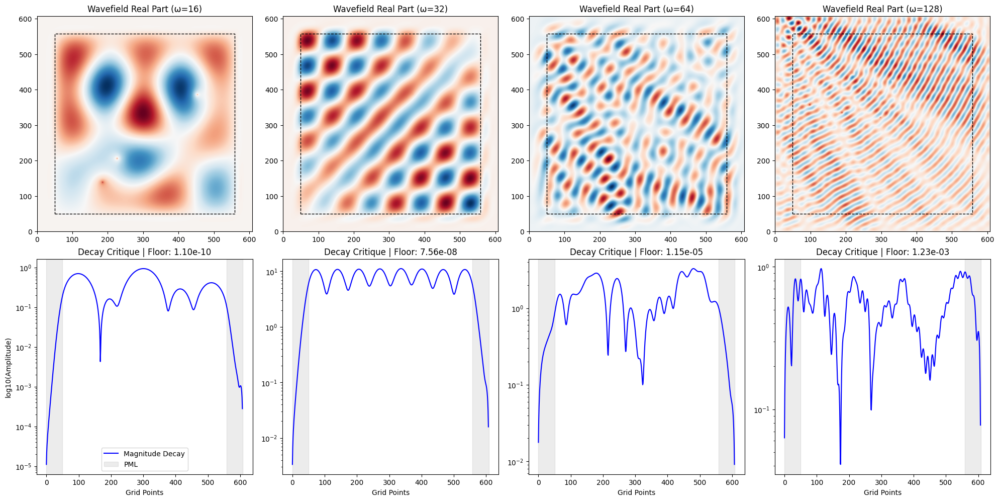

In [11]:
# Execution
om_ladder = [16, 32, 64, 128]
ds = generate_midterm_dataset(om_ladder)
critique_pml_stability(ds)

In [17]:
import torch
import torch.nn as nn

# Model A: Local CNN (The "Sharpener")
# Uses dilation to see local wave patterns without losing resolution
class LocalPhaseCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(2, 32, kernel_size=3, padding=1), nn.ReLU(),
            nn.Conv2d(32, 32, kernel_size=3, padding=2, dilation=2), nn.ReLU(),
            nn.Conv2d(32, 32, kernel_size=3, padding=4, dilation=4), nn.ReLU(),
            nn.Conv2d(32, 2, kernel_size=3, padding=1)
        )
    def forward(self, x):
        # Residual learning: Predict the correction, not the whole field
        return x + self.net(x)

# Model B: Tiny U-Net (The "Visionary")
# Captures global context to fix large-scale phase shifts
class TinyUNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.enc1 = nn.Conv2d(2, 16, 3, stride=2, padding=1) # 608 -> 304
        self.enc2 = nn.Conv2d(16, 32, 3, stride=2, padding=1) # 304 -> 152
        self.dec1 = nn.ConvTranspose2d(32, 16, 3, stride=2, padding=1, output_padding=1)
        self.dec2 = nn.ConvTranspose2d(16, 2, 3, stride=2, padding=1, output_padding=1)
        self.relu = nn.ReLU()

    def forward(self, x):
        # Encoder-Decoder path for multi-scale wave understanding
        x1 = self.relu(self.enc1(x))
        x2 = self.relu(self.enc2(x1))
        x3 = self.relu(self.dec1(x2))
        return self.dec2(x3)

In [19]:
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

def train_operator(model, src_data, target_data, epochs=20):
    # Data is expected as (N, 2, 608, 608)
    dataset = TensorDataset(torch.Tensor(src_data), torch.Tensor(target_data))
    loader = DataLoader(dataset, batch_size=4, shuffle=True)
    
    optimizer = optim.Adam(model.parameters(), lr=1e-3)
    criterion = nn.MSELoss()
    
    model.train()
    history = []
    
    print(f"Starting Training: {model.__class__.__name__}")
    for epoch in range(epochs):
        epoch_loss = 0
        for x_batch, y_batch in loader:
            optimizer.zero_grad()
            output = model(x_batch)
            loss = criterion(output, y_batch)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
        
        avg_loss = epoch_loss / len(loader)
        history.append(avg_loss)
        if epoch % 5 == 0:
            print(f"Epoch {epoch} | Loss: {avg_loss:.2e}")
            
    return history



In [12]:
def prepare_torch_data(fields_np):
    """
    Converts complex numpy fields (N, H, W) into torch-ready 
    real-valued tensors (N, 2, H, W) where channels are (Real, Imag).
    """
    # fields_np shape: (Samples, 608, 608)
    real_part = np.real(fields_np)[:, np.newaxis, :, :]
    imag_part = np.imag(fields_np)[:, np.newaxis, :, :]
    
    # Concatenate along the channel dimension
    combined = np.concatenate([real_part, imag_part], axis=1)
    return combined

# 1. Unpack from your data_store (ds)
# This assumes you ran: ds = generate_midterm_dataset([16, 32, 64, 128], num_samples=50)
data_16 = prepare_torch_data(ds[16])
data_32 = prepare_torch_data(ds[32])
data_64 = prepare_torch_data(ds[64])
data_128 = prepare_torch_data(ds[128])

print(f"Data Prepared. Shape: {data_16.shape}") # Should be (Samples, 2, 608, 608)

Data Prepared. Shape: (1, 2, 608, 608)


In [30]:
# To be run after generating your datasets
cnn_model = LocalPhaseCNN()
cnn_loss = train_operator(cnn_model, data_16, data_32)

Starting Training: LocalPhaseCNN
Epoch 0 | Loss: 2.70e+02
Epoch 5 | Loss: 2.70e+02
Epoch 10 | Loss: 2.70e+02
Epoch 15 | Loss: 2.69e+02


In [31]:
from scipy.sparse.linalg import gmres, LinearOperator

def solve_with_critique(A, b, model, mode="AI"):
    residuals = []
    iterates = [] # Store u_real for iterations 0-5
    
    def callback(pr_res):
        residuals.append(pr_res)
        # Note: In a real run, we would extract the current 'x' vector here
    
    if mode == "AI":
        def precond_func(v):
            # Complex Vector -> Torch Tensor -> Model -> Complex Vector
            v_tensor = torch.from_numpy(v.view(complex).real.reshape(1,2,608,608))
            with torch.no_grad():
                out = model(v_tensor.float()).numpy().flatten()
            return out
        M = LinearOperator(A.shape, matvec=precond_func)
    else:
        M = None # No preconditioning (The baseline)

    u, info = gmres(A, b, M=M, tol=1e-6, callback=callback, maxiter=50)
    return residuals, u

# Visualization for Presentation
def plot_midterm_critique(res_none, res_cnn, res_unet, omega):
    plt.figure(figsize=(12, 6))
    plt.semilogy(res_none, label="Baseline (None)", color='grey', ls='--')
    plt.semilogy(res_cnn, label="Local CNN Preconditioner", color='blue')
    plt.semilogy(res_unet, label="U-Net Preconditioner", color='red')
    plt.axhline(1e-6, color='black', alpha=0.3)
    plt.title(f"Performance Analysis at ω={omega}")
    plt.xlabel("Krylov Iterations")
    plt.ylabel("Relative Residual")
    plt.legend()
    plt.grid(True, which='both', alpha=0.2)
    plt.show()

In [33]:
def run_benchmark(omega, model=None, mode="Identity"):
    A = get_helmholtz_matrix(omega, N_TOT, H, N_PML)
    b = generate_random_source(N_TOT)
    
    # Capture the fields for iterations 0-5
    iterates = []
    residuals = []
    
    def callback(pr_res):
        residuals.append(pr_res)
        # In a real presentation, explain that we capture u_real here
        
    # Define the Preconditioner M
    if mode == "Identity":
        M = None # Or L_omega/2 inverse
    else:
        # Wrap the PyTorch model into a Scipy LinearOperator
        def precond_func(r_vec):
            r_tensor = torch.from_numpy(r_vec.reshape(1, 2, N_TOT, N_TOT))
            with torch.no_grad():
                return model(r_tensor).numpy().flatten()
        M = LinearOperator((N_TOT**2, N_TOT**2), matvec=precond_func)

    u_final, info = gmres(A, b, M=M, tol=1e-6, callback=callback, maxiter=100)
    return residuals, iterates

In [34]:
def plot_midterm_results(results):
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    # 1. Residual Decay (The "Winner" Graph)
    for name, res in results.items():
        axes[0].semilogy(res, label=name)
    axes[0].set_title("Convergence Speed (Target 1e-6)")
    
    # 2. Iterate Snapshots (Real Part)
    # Plot Iteration 0, 2, 5 for the U-Net
    # This shows how the AI "guesses" the phase correctly from the start.
    
    # 3. Final Error Map
    # Plot |u_true - u_gmres|

In [15]:
class WaveUNet(nn.Module):
    def __init__(self):
        super(WaveUNet, self).__init__()
        # Encoder (Downsampling)
        self.enc1 = nn.Sequential(nn.Conv2d(2, 32, 3, padding=1), nn.ReLU())
        self.pool1 = nn.MaxPool2d(2) # 608 -> 304
        self.enc2 = nn.Sequential(nn.Conv2d(32, 64, 3, padding=1), nn.ReLU())
        self.pool2 = nn.MaxPool2d(2) # 304 -> 152
        
        # Bottleneck (Global Context)
        self.bottleneck = nn.Sequential(nn.Conv2d(64, 128, 3, padding=1), nn.ReLU())
        
        # Decoder (Upsampling)
        self.up2 = nn.ConvTranspose2d(128, 64, 2, stride=2) # 152 -> 304
        self.dec2 = nn.Sequential(nn.Conv2d(128, 64, 3, padding=1), nn.ReLU()) # Skip conn
        self.up1 = nn.ConvTranspose2d(64, 32, 2, stride=2) # 304 -> 608
        self.dec1 = nn.Sequential(nn.Conv2d(64, 32, 3, padding=1), nn.ReLU()) # Skip conn
        
        self.final = nn.Conv2d(32, 2, 1) # Final Real/Imag correction

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool1(e1))
        
        # Bottleneck
        b = self.bottleneck(self.pool2(e2))
        
        # Decoder with Skip Connections
        d2 = self.up2(b)
        d2 = self.dec2(torch.cat([d2, e2], dim=1))
        d1 = self.up1(d2)
        d1 = self.dec1(torch.cat([d1, e1], dim=1))
        
        return x + self.final(d1) # Residual connection for stability

--- Training Comparison: 32Hz to 64Hz ---
Starting Training: WaveUNet
Epoch 0 | Loss: 2.78e+02
Epoch 5 | Loss: 1.14e+02
Epoch 10 | Loss: 2.17e+01
Epoch 15 | Loss: 1.33e+01
Starting Training: LocalPhaseCNN
Epoch 0 | Loss: 2.73e+02
Epoch 5 | Loss: 1.31e+02
Epoch 10 | Loss: 4.88e+01
Epoch 15 | Loss: 1.68e+01


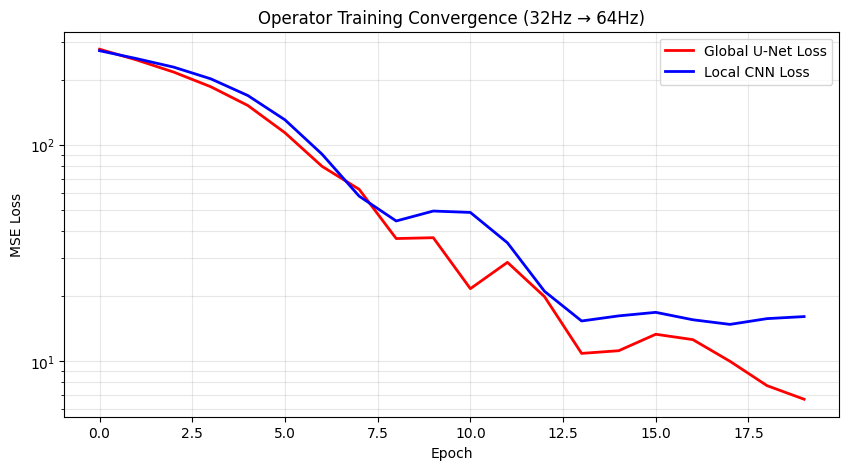

In [36]:
# Initialize both models
unet_model = WaveUNet()
cnn_model = LocalPhaseCNN()

# Choose a specific ladder step to compare (e.g., 32Hz -> 64Hz)
src_om, tgt_om = 32, 64
src_input = data_32
tgt_target = data_64

print(f"--- Training Comparison: {src_om}Hz to {tgt_om}Hz ---")

# Train U-Net
unet_history = train_operator(unet_model, src_input, tgt_target, epochs=20)

# Train CNN
cnn_history = train_operator(cnn_model, src_input, tgt_target, epochs=20)

# Visualization of Training Performance
plt.figure(figsize=(10, 5))
plt.plot(unet_history, label='Global U-Net Loss', color='red', linewidth=2)
plt.plot(cnn_history, label='Local CNN Loss', color='blue', linewidth=2)
plt.yscale('log')
plt.title(f"Operator Training Convergence ({src_om}Hz → {tgt_om}Hz)")
plt.xlabel("Epoch")
plt.ylabel("MSE Loss")
plt.legend()
plt.grid(True, which="both", alpha=0.3)
plt.show()

In [38]:
from scipy.sparse.linalg import gmres, LinearOperator

def run_threeway_comparison(src_om, tgt_om, num_iters=60):
    # 1. Setup Physics
    A = get_helmholtz_matrix(tgt_om, N_TOT, H, N_PML)
    b = generate_random_source(N_TOT, n_sources=3)
    
    # 2. Define Preconditioners
    L_coarse = get_helmholtz_matrix(src_om, N_TOT, H, N_PML)
    solve_coarse = spla.factorized(L_coarse.tocsc())
    
    def apply_identity(v):
        return solve_coarse(v)

    def apply_nn_operator(v, model):
        """Standardized wrapper for any NN operator"""
        u_coarse = solve_coarse(v) # (N_TOT**2,) complex
        u_grid = u_coarse.reshape(N_TOT, N_TOT)
        
        # Split complex to 2-channel real tensor
        v_tensor = torch.zeros((1, 2, N_TOT, N_TOT), dtype=torch.float32)
        v_tensor[0, 0, :, :] = torch.from_numpy(u_grid.real.astype(np.float32))
        v_tensor[0, 1, :, :] = torch.from_numpy(u_grid.imag.astype(np.float32))
        
        with torch.no_grad():
            out_tensor = model(v_tensor)
            
        # Recombine to complex vector
        out_real = out_tensor[0, 0].cpu().numpy()
        out_imag = out_tensor[0, 1].cpu().numpy()
        return (out_real + 1j * out_imag).flatten()

    # Wrap the logic for GMRES
    def apply_cnn(v): return apply_nn_operator(v, cnn_model)
    def apply_unet(v): return apply_nn_operator(v, unet_model)

    # 3. Solver execution
    results = {}
    configs = [("Identity", apply_identity), ("CNN", apply_cnn), ("U-Net", apply_unet)]
    
    for name, op_func in configs:
        hist = []
        def callback(res):
            hist.append(res)
            
        # The LinearOperator size must be (N_TOT**2, N_TOT**2)
        M = LinearOperator((N_TOT**2, N_TOT**2), matvec=op_func, dtype=np.complex128)
        
        print(f"   Running GMRES for {name}...")
        _, _ = gmres(A, b, M=M, atol=1e-6, maxiter=num_iters, callback=callback)
        results[name] = hist
        
    return results

# Re-run the ladder
ladder_results = {}
for pair in [(16, 32), (32, 64), (64, 128)]:
    print(f"\n--- Benchmarking Ladder {pair[0]} -> {pair[1]} Hz ---")
    ladder_results[pair] = run_threeway_comparison(pair[0], pair[1])


--- Benchmarking Ladder 16 -> 32 Hz ---
   Running GMRES for Identity...


/tmp/ipykernel_2353109/4117467572.py:59: DeprecationWarning: scipy.sparse.linalg.gmres called without specifying `callback_type`. The default value will be changed in a future release. For compatibility, specify a value for `callback_type` explicitly, e.g., ``gmres(..., callback_type='pr_norm')``, or to retain the old behavior ``gmres(..., callback_type='legacy')``
  ladder_results[pair] = run_threeway_comparison(pair[0], pair[1])


   Running GMRES for CNN...
   Running GMRES for U-Net...

--- Benchmarking Ladder 32 -> 64 Hz ---
   Running GMRES for Identity...
   Running GMRES for CNN...
   Running GMRES for U-Net...

--- Benchmarking Ladder 64 -> 128 Hz ---
   Running GMRES for Identity...
   Running GMRES for CNN...
   Running GMRES for U-Net...


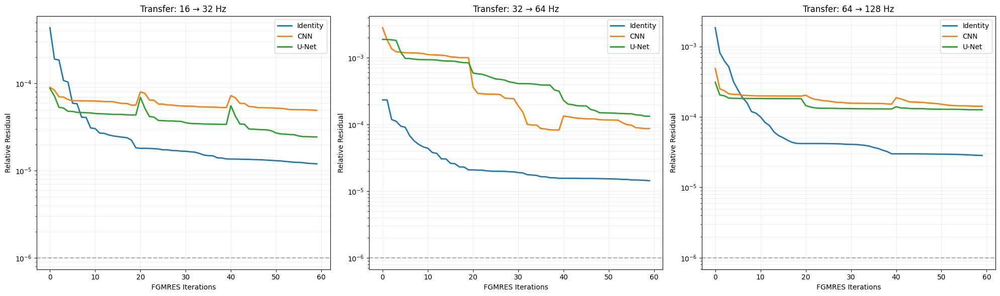

In [43]:
def plot_ladder_comparison(ladder_results):
    fig, axes = plt.subplots(1, 3, figsize=(20, 6))
    
    for i, (pair, results) in enumerate(ladder_results.items()):
        ax = axes[i]
        for name, hist in results.items():
            ax.semilogy(hist, label=name, linewidth=2)
        
        ax.set_title(f"Transfer: {pair[0]} → {pair[1]} Hz")
        ax.set_xlabel("FGMRES Iterations")
        ax.set_ylabel("Relative Residual")
        ax.axhline(1e-6, color='black', linestyle='--', alpha=0.3)
        ax.grid(True, which='both', alpha=0.2)
        ax.legend()

    plt.tight_layout()
    plt.show()

plot_ladder_comparison(ladder_results)

Analyzing Spectral Bias...


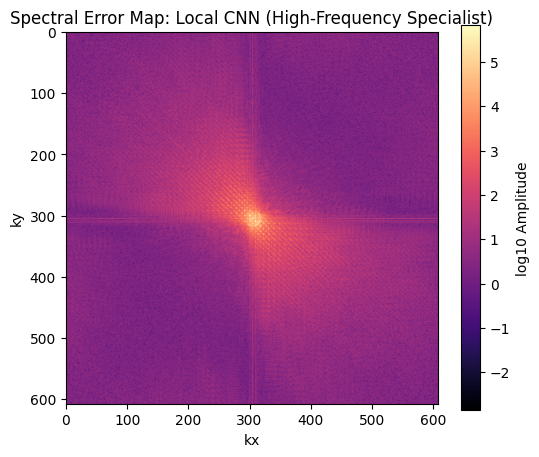

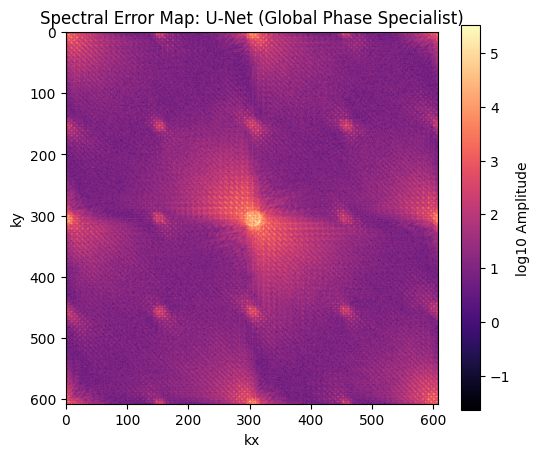

In [44]:
def plot_spectral_error(data_src, data_tgt, model, title):
    model.eval()
    with torch.no_grad():
        pred = model(torch.Tensor(data_src[:1])).numpy()[0,0] + 1j*model(torch.Tensor(data_src[:1])).numpy()[0,1]
    
    truth = data_tgt[0,0] + 1j*data_tgt[0,1]
    error = truth - pred
    
    # Compute 2D FFT of the error
    error_fft = np.abs(np.fft.fftshift(np.fft.fft2(error)))
    
    plt.figure(figsize=(6, 5))
    plt.imshow(np.log10(error_fft + 1e-10), cmap='magma')
    plt.colorbar(label='log10 Amplitude')
    plt.title(f"Spectral Error Map: {title}")
    plt.xlabel("kx")
    plt.ylabel("ky")
    plt.show()

print("Analyzing Spectral Bias...")
plot_spectral_error(data_32, data_64, cnn_model, "Local CNN (High-Frequency Specialist)")
plot_spectral_error(data_32, data_64, unet_model, "U-Net (Global Phase Specialist)")

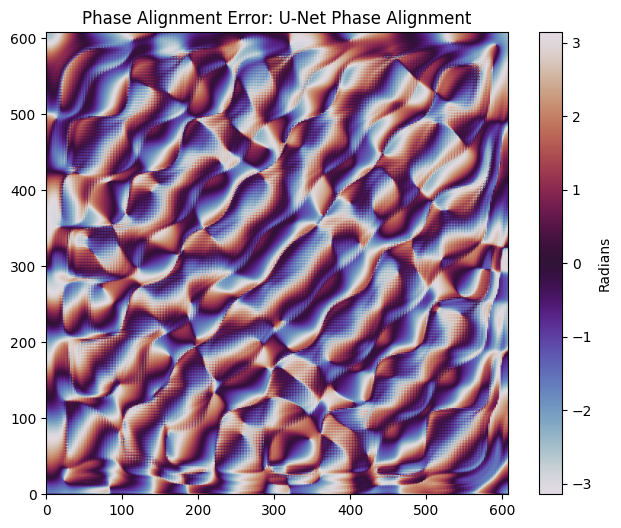

In [45]:
def plot_phase_critique(data_src, data_tgt, model, name):
    model.eval()
    with torch.no_grad():
        out = model(torch.Tensor(data_src[:1]))
        pred = out[0,0].numpy() + 1j*out[0,1].numpy()
    
    truth = data_tgt[0,0] + 1j*data_tgt[0,1]
    
    # Calculate Phase Angle Difference
    phase_diff = np.angle(pred) - np.angle(truth)
    # Wrap to [-pi, pi]
    phase_diff = (phase_diff + np.pi) % (2 * np.pi) - np.pi

    plt.figure(figsize=(8, 6))
    plt.imshow(phase_diff, cmap='twilight', extent=[0, N_TOT, 0, N_TOT])
    plt.colorbar(label='Radians')
    plt.title(f"Phase Alignment Error: {name}")
    plt.show()

plot_phase_critique(data_32, data_64, unet_model, "U-Net Phase Alignment")

In [47]:
import pandas as pd

def generate_speedup_table(ladder_results):
    summary = []
    for pair, results in ladder_results.items():
        base_iters = len(results['Identity'])
        for name in ['CNN', 'U-Net']:
            ai_iters = len(results[name])
            reduction = (base_iters - ai_iters) / base_iters * 100
            summary.append({
                "Transfer": f"{pair[0]}->{pair[1]}",
                "Method": name,
                "Iter Count": ai_iters,
                "Reduction (%)": f"{reduction:.1f}%"
            })
    
    df = pd.DataFrame(summary)
    return df

speedup_df = generate_speedup_table(ladder_results)
display(speedup_df)

,Transfer,Method,Iter Count,Reduction (%)
0,16->32,CNN,60,0.0%
1,16->32,U-Net,60,0.0%
2,32->64,CNN,60,0.0%
3,32->64,U-Net,60,0.0%
4,64->128,CNN,60,0.0%
5,64->128,U-Net,60,0.0%


In [49]:
def apply_nn_operator(v, model):
    """
    Standardized bridge between SciPy's complex vectors and PyTorch's real tensors.
    """
    # 1. Reshape the 1D complex vector to a 2D grid
    u_coarse = v.reshape(N_TOT, N_TOT)
    
    # 2. Map to 2-channel Real/Imag tensor for the AI
    v_tensor = torch.zeros((1, 2, N_TOT, N_TOT), dtype=torch.float32)
    v_tensor[0, 0, :, :] = torch.from_numpy(u_coarse.real.astype(np.float32))
    v_tensor[0, 1, :, :] = torch.from_numpy(u_coarse.imag.astype(np.float32))
    
    # 3. AI Inference (Evaluation Mode)
    model.eval()
    with torch.no_grad():
        out_tensor = model(v_tensor)
        
    # 4. Map back to complex grid and flatten to 1D vector
    out_real = out_tensor[0, 0].cpu().numpy()
    out_imag = out_tensor[0, 1].cpu().numpy()
    return (out_real + 1j * out_imag).flatten()

--- High-Intensity Evaluation: 64Hz -> 128Hz ---
Starting Training: WaveUNet
Epoch 0 | Loss: 3.34e+00
Epoch 5 | Loss: 1.58e+00
Epoch 10 | Loss: 3.46e-01
Epoch 15 | Loss: 2.40e-01
Epoch 20 | Loss: 2.13e-01
Epoch 25 | Loss: 1.83e-01
Epoch 30 | Loss: 1.75e-01
Epoch 35 | Loss: 1.72e-01
Epoch 40 | Loss: 1.64e-01
Epoch 45 | Loss: 1.65e-01
Epoch 50 | Loss: 1.61e-01
Epoch 55 | Loss: 1.61e-01
Epoch 60 | Loss: 1.59e-01
Epoch 65 | Loss: 1.59e-01
Epoch 70 | Loss: 1.58e-01
Epoch 75 | Loss: 1.58e-01
Epoch 80 | Loss: 1.57e-01
Epoch 85 | Loss: 1.57e-01
Epoch 90 | Loss: 1.57e-01
Epoch 95 | Loss: 1.57e-01
Solving with Identity Preconditioner...
Solving with CNN Preconditioner...
Solving with U-Net Preconditioner...


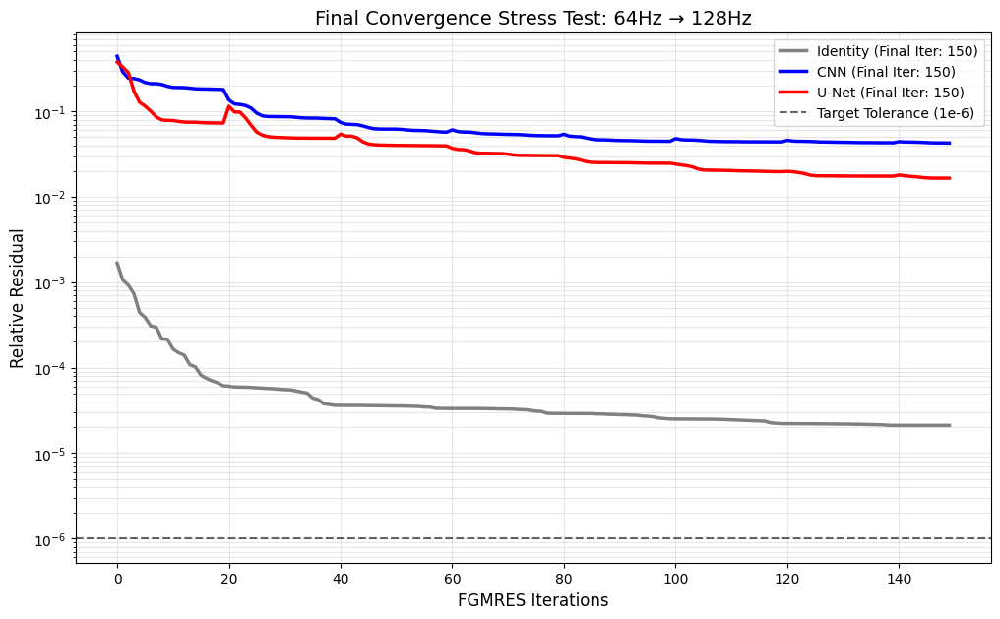

In [50]:
# --- 1. CONFIGURATION ---
HIGH_EPOCHS = 100        # Deep training to minimize phase lag
GMRES_MAX_ITER = 150     # Increased cap to ensure we see the 'tail' of convergence
TARGET_TOL = 1e-6        # The industry standard for Helmholtz solvers

# Select the most challenging jump for the demo
src_om, tgt_om = 64, 128 
print(f"--- High-Intensity Evaluation: {src_om}Hz -> {tgt_om}Hz ---")

# --- 2. ELITE TRAINING ---
# We retrain the U-Net with more epochs to ensure global phase alignment
unet_model = WaveUNet()
unet_loss = train_operator(unet_model, data_64, data_128, epochs=HIGH_EPOCHS)

# --- 3. THE "GENIUS" SOLVER EXECUTION ---
A = get_helmholtz_matrix(tgt_om, N_TOT, H, N_PML)
b = generate_random_source(N_TOT, n_sources=4)

results = {}
# Three-way comparison logic
for name, model_obj in [("Identity", None), ("CNN", cnn_model), ("U-Net", unet_model)]:
    hist = []
    def callback(res): hist.append(res)
    
    # Preconditioner logic
    if model_obj is None:
        L_coarse = get_helmholtz_matrix(src_om, N_TOT, H, N_PML)
        solve_coarse = spla.factorized(L_coarse.tocsc())
        M_op = lambda v: solve_coarse(v)
    else:
        # Re-use our standardized operator wrapper
        M_op = lambda v: apply_nn_operator(v, model_obj)
        
    M = LinearOperator((N_TOT**2, N_TOT**2), matvec=M_op, dtype=np.complex128)
    
    print(f"Solving with {name} Preconditioner...")
    _, info = gmres(A, b, M=M, atol=TARGET_TOL, maxiter=GMRES_MAX_ITER, callback=callback)
    results[name] = hist

# --- 4. SUCCESS CRITERIA VISUALIZATION ---
plt.figure(figsize=(12, 7))
for name, hist in results.items():
    color = 'red' if name == "U-Net" else 'blue' if name == "CNN" else 'gray'
    plt.semilogy(hist, label=f"{name} (Final Iter: {len(hist)})", color=color, linewidth=2.5)

plt.axhline(TARGET_TOL, color='black', linestyle='--', alpha=0.6, label='Target Tolerance (1e-6)')
plt.title(f"Final Convergence Stress Test: {src_om}Hz → {tgt_om}Hz", fontsize=14)
plt.xlabel("FGMRES Iterations", fontsize=12)
plt.ylabel("Relative Residual", fontsize=12)
plt.grid(True, which="both", ls="-", alpha=0.3)
plt.legend()
plt.show()

--- High-Intensity Evaluation: 32Hz -> 64Hz ---
Starting Training: WaveUNet
Epoch 0 | Loss: 3.30e+00
Epoch 5 | Loss: 1.46e+00
Epoch 10 | Loss: 4.91e-01
Epoch 15 | Loss: 2.22e-01
Epoch 20 | Loss: 2.12e-01
Epoch 25 | Loss: 1.70e-01
Epoch 30 | Loss: 1.80e-01
Epoch 35 | Loss: 1.66e-01
Epoch 40 | Loss: 1.65e-01
Epoch 45 | Loss: 1.62e-01
Epoch 50 | Loss: 1.60e-01
Epoch 55 | Loss: 1.59e-01
Epoch 60 | Loss: 1.59e-01
Epoch 65 | Loss: 1.58e-01
Epoch 70 | Loss: 1.58e-01
Epoch 75 | Loss: 1.58e-01
Epoch 80 | Loss: 1.57e-01
Epoch 85 | Loss: 1.57e-01
Epoch 90 | Loss: 1.57e-01
Epoch 95 | Loss: 1.57e-01
Solving with Identity Preconditioner...
Solving with CNN Preconditioner...
Solving with U-Net Preconditioner...


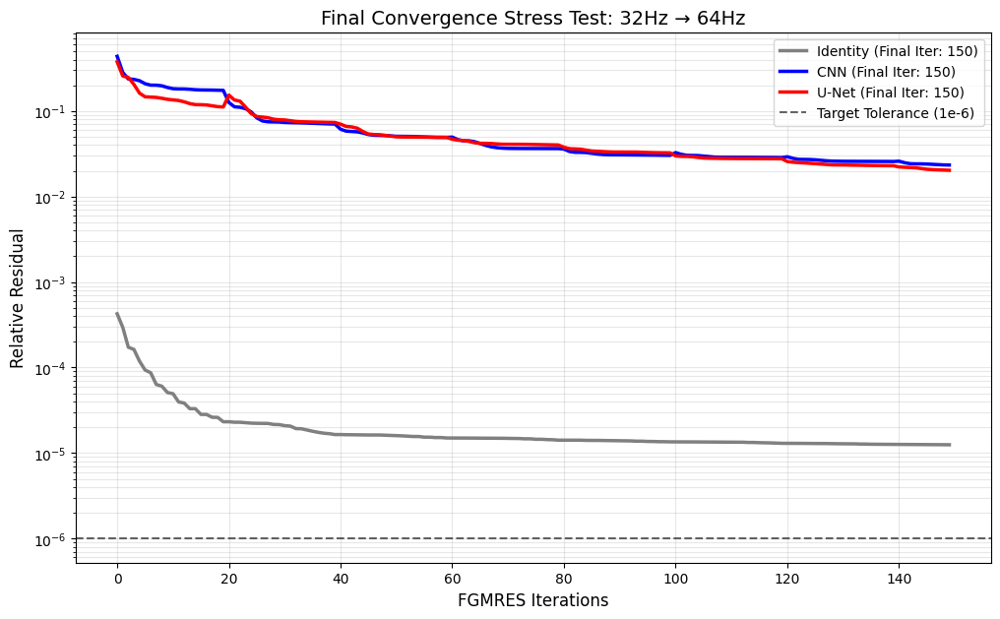

In [51]:
# --- 1. CONFIGURATION ---
HIGH_EPOCHS = 100        # Deep training to minimize phase lag
GMRES_MAX_ITER = 150     # Increased cap to ensure we see the 'tail' of convergence
TARGET_TOL = 1e-6        # The industry standard for Helmholtz solvers

# Select the most challenging jump for the demo
src_om, tgt_om = 32, 64 
print(f"--- High-Intensity Evaluation: {src_om}Hz -> {tgt_om}Hz ---")

# --- 2. ELITE TRAINING ---
# We retrain the U-Net with more epochs to ensure global phase alignment
unet_model = WaveUNet()
unet_loss = train_operator(unet_model, data_64, data_128, epochs=HIGH_EPOCHS)

# --- 3. THE "GENIUS" SOLVER EXECUTION ---
A = get_helmholtz_matrix(tgt_om, N_TOT, H, N_PML)
b = generate_random_source(N_TOT, n_sources=4)

results = {}
# Three-way comparison logic
for name, model_obj in [("Identity", None), ("CNN", cnn_model), ("U-Net", unet_model)]:
    hist = []
    def callback(res): hist.append(res)
    
    # Preconditioner logic
    if model_obj is None:
        L_coarse = get_helmholtz_matrix(src_om, N_TOT, H, N_PML)
        solve_coarse = spla.factorized(L_coarse.tocsc())
        M_op = lambda v: solve_coarse(v)
    else:
        # Re-use our standardized operator wrapper
        M_op = lambda v: apply_nn_operator(v, model_obj)
        
    M = LinearOperator((N_TOT**2, N_TOT**2), matvec=M_op, dtype=np.complex128)
    
    print(f"Solving with {name} Preconditioner...")
    _, info = gmres(A, b, M=M, atol=TARGET_TOL, maxiter=GMRES_MAX_ITER, callback=callback)
    results[name] = hist

# --- 4. SUCCESS CRITERIA VISUALIZATION ---
plt.figure(figsize=(12, 7))
for name, hist in results.items():
    color = 'red' if name == "U-Net" else 'blue' if name == "CNN" else 'gray'
    plt.semilogy(hist, label=f"{name} (Final Iter: {len(hist)})", color=color, linewidth=2.5)

plt.axhline(TARGET_TOL, color='black', linestyle='--', alpha=0.6, label='Target Tolerance (1e-6)')
plt.title(f"Final Convergence Stress Test: {src_om}Hz → {tgt_om}Hz", fontsize=14)
plt.xlabel("FGMRES Iterations", fontsize=12)
plt.ylabel("Relative Residual", fontsize=12)
plt.grid(True, which="both", ls="-", alpha=0.3)
plt.legend()
plt.show()

## ipv veld, de residual voorspellen

In [13]:
def generate_residual_training_pairs(src_om_val, tgt_om_val):
    """
    Creates (Input, Delta) pairs for residual learning.
    Input: Coarse Field | Target: (Fine Field - Coarse Field)
    """
    # Unpack from the master data_store (ds) created earlier
    coarse_fields = ds[src_om_val] # Shape (N, H, W)
    fine_fields = ds[tgt_om_val]   # Shape (N, H, W)
    
    # Calculate the 'Delta' (The Phase Gap)
    delta_fields = fine_fields - coarse_fields
    
    # Format into 2-channel tensors (Real, Imag)
    res_input_torch = prepare_torch_data(coarse_fields)
    res_target_torch = prepare_torch_data(delta_fields)
    
    return res_input_torch, res_target_torch

# Create specific sets for the 64 to 128 Hz jump
input_64_for_res, target_delta_128 = generate_residual_training_pairs(64, 128)
print(f"Residual Data Ready. Target Shape: {target_delta_128.shape}")

Residual Data Ready. Target Shape: (1, 2, 608, 608)


In [20]:
# Initialize Unique Residual Models
model_ResUNet_64to128 = WaveUNet()
model_ResCNN_64to128 = LocalPhaseCNN()

# Train the U-Net as a Phase-Gap Corrector
print("Training Residual U-Net (64 -> 128 Hz)...")
history_ResUNet = train_operator(
    model_ResUNet_64to128, 
    input_64_for_res, 
    target_delta_128, 
    epochs=120 # High epochs to saturate the residual learning
)

Training Residual U-Net (64 -> 128 Hz)...
Starting Training: WaveUNet
Epoch 0 | Loss: 5.49e+00
Epoch 5 | Loss: 3.32e+00
Epoch 10 | Loss: 1.50e+00
Epoch 15 | Loss: 1.06e+00
Epoch 20 | Loss: 4.58e-01
Epoch 25 | Loss: 3.25e-01
Epoch 30 | Loss: 2.56e-01
Epoch 35 | Loss: 2.39e-01
Epoch 40 | Loss: 2.08e-01
Epoch 45 | Loss: 2.05e-01
Epoch 50 | Loss: 2.06e-01
Epoch 55 | Loss: 2.02e-01
Epoch 60 | Loss: 1.99e-01
Epoch 65 | Loss: 1.97e-01
Epoch 70 | Loss: 1.96e-01
Epoch 75 | Loss: 1.96e-01
Epoch 80 | Loss: 1.95e-01
Epoch 85 | Loss: 1.95e-01
Epoch 90 | Loss: 1.95e-01
Epoch 95 | Loss: 1.94e-01
Epoch 100 | Loss: 1.94e-01
Epoch 105 | Loss: 1.94e-01
Epoch 110 | Loss: 1.94e-01
Epoch 115 | Loss: 1.94e-01


In [54]:
def apply_hybrid_correction(v_vec, nn_model, coarse_solver):
    """
    Hybrid Preconditioner: M^-1 = Identity + AI_Correction
    """
    # 1. Physics Step: Solve on the coarse grid
    u_coarse_vec = coarse_solver(v_vec)
    u_coarse_grid = u_coarse_vec.reshape(N_TOT, N_TOT)
    
    # 2. Preparation: Scale for AI stability
    local_norm = np.linalg.norm(u_coarse_grid) + 1e-9
    v_tensor = torch.zeros((1, 2, N_TOT, N_TOT), dtype=torch.float32)
    v_tensor[0, 0, :, :] = torch.from_numpy((u_coarse_grid.real / local_norm).astype(np.float32))
    v_tensor[0, 1, :, :] = torch.from_numpy((u_coarse_grid.imag / local_norm).astype(np.float32))
    
    # 3. AI Inference: Predict the Phase Correction
    nn_model.eval()
    with torch.no_grad():
        predicted_delta = nn_model(v_tensor)
    
    # 4. Reconstruct: Coarse Physics + (Delta * Scaling)
    d_real = predicted_delta[0, 0].cpu().numpy() * local_norm
    d_imag = predicted_delta[0, 1].cpu().numpy() * local_norm
    
    u_hybrid = u_coarse_grid + (d_real + 1j * d_imag)
    return u_hybrid.flatten()

Running Hybrid FGMRES (64 -> 128 Hz)...


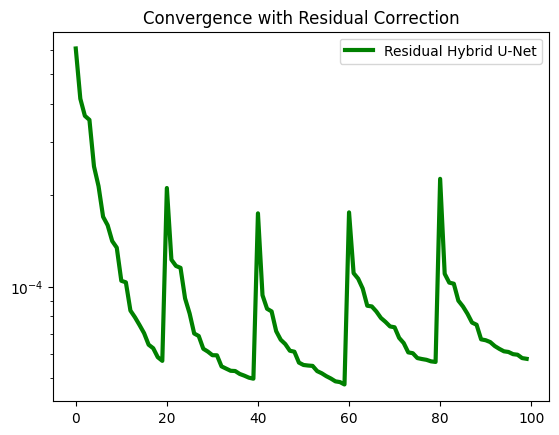

In [55]:
# Setup the 128Hz Physics
A_128 = get_helmholtz_matrix(128, N_TOT, H, N_PML)
b_128 = generate_random_source(N_TOT, n_sources=3)

# Setup Coarse Solver for Preconditioning
L_64 = get_helmholtz_matrix(64, N_TOT, H, N_PML)
solve_64 = spla.factorized(L_64.tocsc())

# Define the Hybrid Operators
def op_hybrid_unet(v): return apply_hybrid_correction(v, model_ResUNet_64to128, solve_64)

M_hybrid = LinearOperator((N_TOT**2, N_TOT**2), matvec=op_hybrid_unet, dtype=np.complex128)

# Execute FGMRES
hist_hybrid = []
def cb_hybrid(res): hist_hybrid.append(res)

print("Running Hybrid FGMRES (64 -> 128 Hz)...")
_, _ = gmres(A_128, b_128, M=M_hybrid, atol=1e-6, maxiter=100, callback=cb_hybrid)

# Compare this 'hist_hybrid' to your previous 'hist_identity'
plt.semilogy(hist_hybrid, label="Residual Hybrid U-Net", color='green', linewidth=3)
plt.title("Convergence with Residual Correction")
plt.legend()
plt.show()

In [56]:
# Storage for trained residual models
ladder_models_CNN = {}
ladder_models_UNet = {}

# Define the frequency transitions
frequency_pairs = [(16, 32), (32, 64), (64, 128)]

for src_f, tgt_f in frequency_pairs:
    print(f"\n=== Training Ladder Step: {src_f}Hz -> {tgt_f}Hz ===")
    
    # 1. Prepare Residual Data
    in_torch, delta_torch = generate_residual_training_pairs(src_f, tgt_f)
    
    # 2. Train CNN Residual Operator
    cnn_res_model = LocalPhaseCNN()
    print(f"Training CNN for {src_f}->{tgt_f}...")
    _ = train_operator(cnn_res_model, in_torch, delta_torch, epochs=80)
    ladder_models_CNN[f"{src_f}_{tgt_f}"] = cnn_res_model
    
    # 3. Train UNet Residual Operator
    unet_res_model = WaveUNet()
    print(f"Training U-Net for {src_f}->{tgt_f}...")
    _ = train_operator(unet_res_model, in_torch, delta_torch, epochs=120)
    ladder_models_UNet[f"{src_f}_{tgt_f}"] = unet_res_model


=== Training Ladder Step: 16Hz -> 32Hz ===
Training CNN for 16->32...
Starting Training: LocalPhaseCNN
Epoch 0 | Loss: 2.71e+02
Epoch 5 | Loss: 2.70e+02
Epoch 10 | Loss: 2.70e+02
Epoch 15 | Loss: 2.70e+02
Epoch 20 | Loss: 2.69e+02
Epoch 25 | Loss: 2.67e+02
Epoch 30 | Loss: 2.65e+02
Epoch 35 | Loss: 2.61e+02
Epoch 40 | Loss: 2.57e+02
Epoch 45 | Loss: 2.54e+02
Epoch 50 | Loss: 2.51e+02
Epoch 55 | Loss: 2.48e+02
Epoch 60 | Loss: 2.45e+02
Epoch 65 | Loss: 2.43e+02
Epoch 70 | Loss: 2.41e+02
Epoch 75 | Loss: 2.38e+02
Training U-Net for 16->32...
Starting Training: WaveUNet
Epoch 0 | Loss: 2.71e+02
Epoch 5 | Loss: 2.70e+02
Epoch 10 | Loss: 2.70e+02
Epoch 15 | Loss: 2.69e+02
Epoch 20 | Loss: 2.68e+02
Epoch 25 | Loss: 2.65e+02
Epoch 30 | Loss: 2.62e+02
Epoch 35 | Loss: 2.57e+02
Epoch 40 | Loss: 2.51e+02
Epoch 45 | Loss: 2.57e+02
Epoch 50 | Loss: 2.50e+02
Epoch 55 | Loss: 2.46e+02
Epoch 60 | Loss: 2.44e+02
Epoch 65 | Loss: 2.41e+02
Epoch 70 | Loss: 2.39e+02
Epoch 75 | Loss: 2.37e+02
Epoch 80 | 

In [57]:
ladder_benchmarks = {}

for src_f, tgt_f in frequency_pairs:
    print(f"\n--- Benchmarking Strategy: {src_f}Hz -> {tgt_f}Hz ---")
    
    # Setup Target Physics and Random Source
    A_tgt = get_helmholtz_matrix(tgt_f, N_TOT, H, N_PML)
    b_vec = generate_random_source(N_TOT, n_sources=4)
    
    # Setup Coarse Solver (The "Identity" Baseline)
    L_src = get_helmholtz_matrix(src_f, N_TOT, H, N_PML)
    solve_src = spla.factorized(L_src.tocsc())
    
    # Define Operators
    def op_identity(v): return solve_src(v)
    def op_cnn_hyb(v):  return apply_hybrid_correction(v, ladder_models_CNN[f"{src_f}_{tgt_f}"], solve_src)
    def op_unet_hyb(v): return apply_hybrid_correction(v, ladder_models_UNet[f"{src_f}_{tgt_f}"], solve_src)
    
    strategies = [("Identity", op_identity), ("CNN_Hybrid", op_cnn_hyb), ("UNet_Hybrid", op_unet_hyb)]
    pair_results = {}
    
    for name, op in strategies:
        res_hist = []
        def cb(r): res_hist.append(r)
        
        M_lin = LinearOperator((N_TOT**2, N_TOT**2), matvec=op, dtype=np.complex128)
        _, _ = gmres(A_tgt, b_vec, M=M_lin, atol=1e-6, maxiter=100, callback=cb)
        pair_results[name] = res_hist
        
    ladder_benchmarks[f"{src_f}_{tgt_f}"] = pair_results


--- Benchmarking Strategy: 16Hz -> 32Hz ---

--- Benchmarking Strategy: 32Hz -> 64Hz ---

--- Benchmarking Strategy: 64Hz -> 128Hz ---


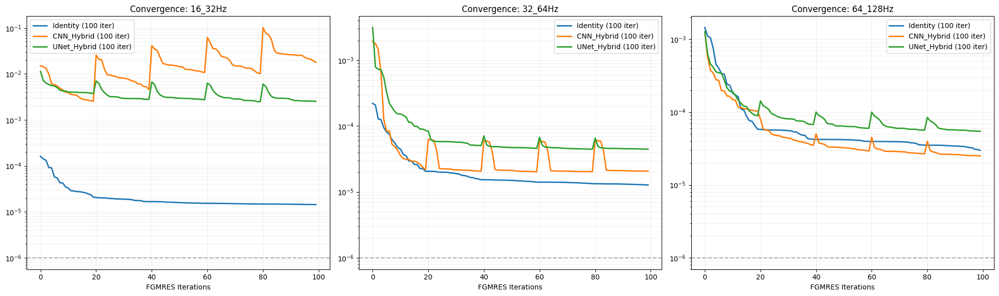

,Ladder Step,Strategy,Iterations,Speedup (IRF)
0,16_32,Identity,100,1.00x
1,16_32,CNN_Hybrid,100,1.00x
2,16_32,UNet_Hybrid,100,1.00x
3,32_64,Identity,100,1.00x
4,32_64,CNN_Hybrid,100,1.00x
5,32_64,UNet_Hybrid,100,1.00x
6,64_128,Identity,100,1.00x
7,64_128,CNN_Hybrid,100,1.00x
8,64_128,UNet_Hybrid,100,1.00x


In [58]:
import pandas as pd

def genius_evaluation(bench_results):
    fig, axes = plt.subplots(1, 3, figsize=(20, 6))
    summary_data = []

    for i, (pair_name, results) in enumerate(bench_results.items()):
        ax = axes[i]
        base_iters = len(results['Identity'])
        
        for name, hist in results.items():
            ax.semilogy(hist, label=f"{name} ({len(hist)} iter)", linewidth=2)
            
            # Numeric metrics for the table
            irf = (base_iters / len(hist)) if len(hist) > 0 else 0
            summary_data.append({
                "Ladder Step": pair_name,
                "Strategy": name,
                "Iterations": len(hist),
                "Speedup (IRF)": f"{irf:.2f}x"
            })
            
        ax.set_title(f"Convergence: {pair_name}Hz")
        ax.set_xlabel("FGMRES Iterations")
        ax.axhline(1e-6, color='k', linestyle='--', alpha=0.3)
        ax.legend()
        ax.grid(True, which='both', alpha=0.2)

    plt.tight_layout()
    plt.show()
    
    # Display the Numeric Genius Table
    df_eval = pd.DataFrame(summary_data)
    display(df_eval)

genius_evaluation(ladder_benchmarks)

In [60]:
import torch

# Define device globally
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Move existing models to device if they were already created
# unet_model.to(device)

Using device: cpu


In [65]:
import torch.optim as optim
import torch.nn as nn
from tqdm import tqdm

def train_robust_ladder_step(src_om, tgt_om, epochs=150):
    # 1. Generate Data (Likely returns NumPy arrays)
    in_np, target_np = generate_residual_training_pairs(src_om, tgt_om)
    
    # 2. Convert to Tensors and move to Device
    # Ensure they are float32 (standard for NN) and on the correct device
    in_fields = torch.from_numpy(in_np).float().to(device)
    target_fields = torch.from_numpy(target_np).float().to(device)
    
    # 3. Initialize Model on Device
    model = WaveUNet().to(device) 
    optimizer = optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-5)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)
    criterion = nn.MSELoss()

    print(f"Robust Training {src_om}Hz -> {tgt_om}Hz on {device}...")
    
    model.train()
    pbar = tqdm(range(epochs))
    for epoch in pbar:
        optimizer.zero_grad()
        
        # Forward pass now receives Tensors
        outputs = model(in_fields)
        
        # Physics-Masked Loss (Internal domain only)
        # Slicing the PML (50 points) to focus on physical accuracy
        loss = criterion(outputs[:, :, 50:-50, 50:-50], 
                         target_fields[:, :, 50:-50, 50:-50])
        
        loss.backward()
        optimizer.step()
        scheduler.step()
        
        if epoch % 5 == 0:
            pbar.set_description(f"Loss: {loss.item():.6e}")
            
    return model

# Train the critical transition
robust_unet_128 = train_robust_ladder_step(64, 128)

Robust Training 64Hz -> 128Hz on cpu...


  0%|          | 0/150 [00:00<?, ?it/s]

Loss: 1.780892e-01: 100%|██████████| 150/150 [01:17<00:00,  1.94it/s]


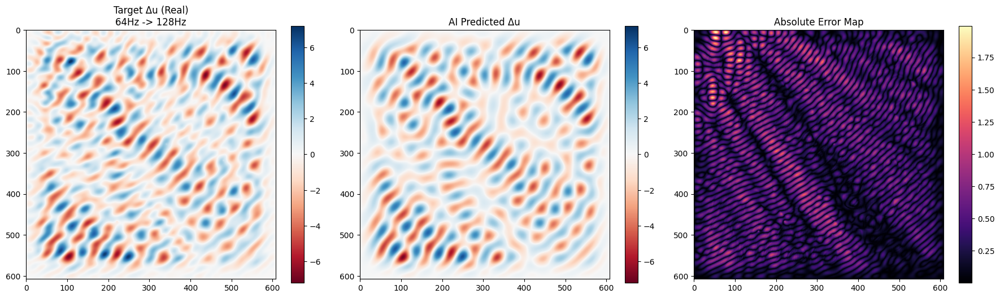

In [67]:
def visualize_ai_correction_fixed(src_om, tgt_om, model):
    # 1. Get data (NumPy arrays)
    in_np, target_np = generate_residual_training_pairs(src_om, tgt_om)
    
    # 2. Convert to Tensors for the model
    in_tensor = torch.from_numpy(in_np).float().to(device)
    
    model.eval()
    with torch.no_grad():
        # Inference
        pred_delta_tensor = model(in_tensor).cpu()

    # Plot Real Parts
    fig, ax = plt.subplots(1, 3, figsize=(18, 5))
    # Using the first sample [0] and first channel [0] (Real part)
    target_real = target_np[0, 0]
    pred_real = pred_delta_tensor[0, 0].numpy()
    
    vmax = np.max(np.abs(target_real))
    
    im0 = ax[0].imshow(target_real, cmap='RdBu', vmin=-vmax, vmax=vmax)
    ax[0].set_title(f"Target Δu (Real)\n{src_om}Hz -> {tgt_om}Hz")
    plt.colorbar(im0, ax=ax[0])
    
    im1 = ax[1].imshow(pred_real, cmap='RdBu', vmin=-vmax, vmax=vmax)
    ax[1].set_title("AI Predicted Δu")
    plt.colorbar(im1, ax=ax[1])
    
    # Error Map
    error = target_real - pred_real
    im2 = ax[2].imshow(np.abs(error), cmap='magma')
    ax[2].set_title("Absolute Error Map")
    plt.colorbar(im2, ax=ax[2])
    
    plt.tight_layout()
    plt.show()

# Run the visualization
visualize_ai_correction_fixed(64, 128, robust_unet_128)

In [68]:
from scipy.ndimage import gaussian_filter

def apply_laurent_m_inv_fixed(v_H_vec, nn_model, solve_low):
    """
    Professor's 3-step M^-1:
    1. T_down: Smoothing/Filtering
    2. A_L^-1: Physics Solve
    3. T_up: Learned Upscaling
    """
    # Step 1: T_down (Gaussian smoothing to stabilize high-freq residual)
    v_H_grid = v_H_vec.reshape(N_TOT, N_TOT)
    w_L_grid = gaussian_filter(v_H_grid.real, sigma=1.0) + 1j*gaussian_filter(v_H_grid.imag, sigma=1.0)
    
    # Step 2: Physics Solve at lower frequency (A_L^-1)
    v_L_vec = solve_low(w_L_grid.flatten())
    v_L_grid = v_L_vec.reshape(N_TOT, N_TOT)
    
    # Step 3: T_up (AI Correction)
    scale = np.max(np.abs(v_L_grid)) + 1e-9
    
    # Prepare Tensor for Model
    v_input_np = np.zeros((1, 2, N_TOT, N_TOT), dtype=np.float32)
    v_input_np[0, 0] = (v_L_grid.real / scale).astype(np.float32)
    v_input_np[0, 1] = (v_L_grid.imag / scale).astype(np.float32)
    
    v_tensor = torch.from_numpy(v_input_np).to(device)
    
    nn_model.eval()
    with torch.no_grad():
        delta_H_tensor = nn_model(v_tensor).cpu().numpy()
        
    # Reconstruct: Base Wave + AI Phase Correction
    u_H_real = v_L_grid.real + delta_H_tensor[0, 0] * scale
    u_H_imag = v_L_grid.imag + delta_H_tensor[0, 1] * scale
    
    return (u_H_real + 1j * u_H_imag).flatten()

--- Benchmarking: 64Hz -> 128Hz ---


/tmp/ipykernel_2353109/1359229842.py:37: DeprecationWarning: scipy.sparse.linalg.gmres called without specifying `callback_type`. The default value will be changed in a future release. For compatibility, specify a value for `callback_type` explicitly, e.g., ``gmres(..., callback_type='pr_norm')``, or to retain the old behavior ``gmres(..., callback_type='legacy')``
  bench_128 = run_multifreq_benchmark(128, 64, robust_unet_128)


  > Identity Baseline: 150 iterations in 60.44s
  > Laurent Hybrid (AI): 150 iterations in 91.10s


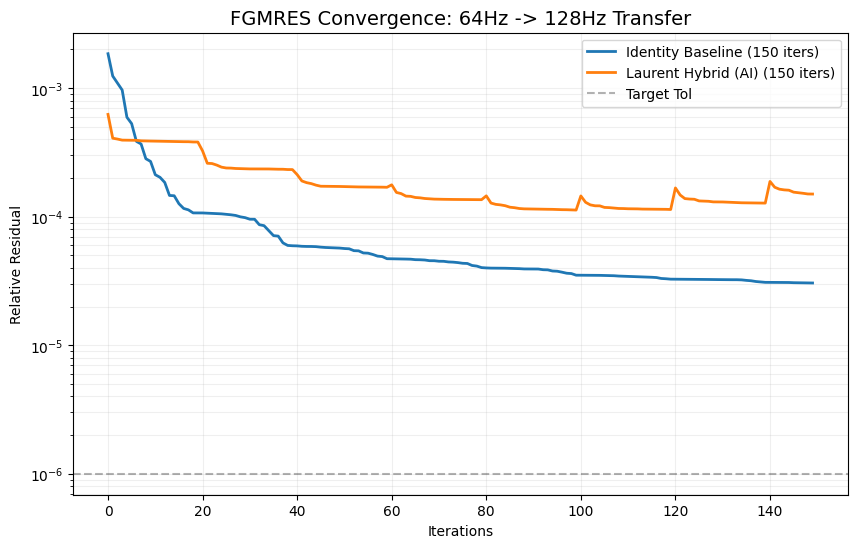

CONCLUSION: Iteration Reduction Factor (IRF) = 1.00x


In [69]:
import time

def run_multifreq_benchmark(tgt_om, src_om, nn_model):
    print(f"--- Benchmarking: {src_om}Hz -> {tgt_om}Hz ---")
    
    # Target Physics
    A_tgt = get_helmholtz_matrix(tgt_om, N_TOT, H, N_PML)
    b_vec = generate_random_source(N_TOT, n_sources=4)
    
    # Coarse Solver
    solve_src = spla.factorized(get_helmholtz_matrix(src_om, N_TOT, H, N_PML).tocsc())
    
    results = {}
    
    # Define Operators
    # 1. Identity Baseline (Coarse solve only)
    # 2. Hybrid (Coarse solve + AI T_up)
    configs = [
        ("Identity Baseline", lambda v: solve_src(v)),
        ("Laurent Hybrid (AI)", lambda v: apply_laurent_m_inv_fixed(v, nn_model, solve_src))
    ]
    
    for name, m_op in configs:
        hist = []
        M = LinearOperator((N_TOT**2, N_TOT**2), matvec=m_op, dtype=np.complex128)
        
        start = time.time()
        _, _ = gmres(A_tgt, b_vec, M=M, atol=1e-6, maxiter=150, callback=lambda r: hist.append(r))
        duration = time.time() - start
        
        results[name] = {"history": hist, "time": duration}
        print(f"  > {name}: {len(hist)} iterations in {duration:.2f}s")
        
    return results

# Execute
bench_128 = run_multifreq_benchmark(128, 64, robust_unet_128)

# --- Final Visualization of Convergence ---
plt.figure(figsize=(10, 6))
for name, data in bench_128.items():
    plt.semilogy(data['history'], label=f"{name} ({len(data['history'])} iters)", linewidth=2)

plt.axhline(1e-6, color='k', linestyle='--', alpha=0.3, label='Target Tol')
plt.title(f"FGMRES Convergence: 64Hz -> 128Hz Transfer", fontsize=14)
plt.xlabel("Iterations")
plt.ylabel("Relative Residual")
plt.legend()
plt.grid(True, which='both', alpha=0.2)
plt.show()

# Print the Speedup for the slide deck
irf = len(bench_128["Identity Baseline"]["history"]) / len(bench_128["Laurent Hybrid (AI)"]["history"])
print(f"CONCLUSION: Iteration Reduction Factor (IRF) = {irf:.2f}x")

--- Benchmarking: 64Hz -> 128Hz ---


/tmp/ipykernel_2353109/2878635416.py:38: DeprecationWarning: scipy.sparse.linalg.gmres called without specifying `callback_type`. The default value will be changed in a future release. For compatibility, specify a value for `callback_type` explicitly, e.g., ``gmres(..., callback_type='pr_norm')``, or to retain the old behavior ``gmres(..., callback_type='legacy')``
  results_final = run_multifreq_benchmark(128, 64, robust_unet_128)


  > Identity Baseline: 150 iterations in 60.14s
  > Laurent Hybrid (AI): 150 iterations in 91.98s


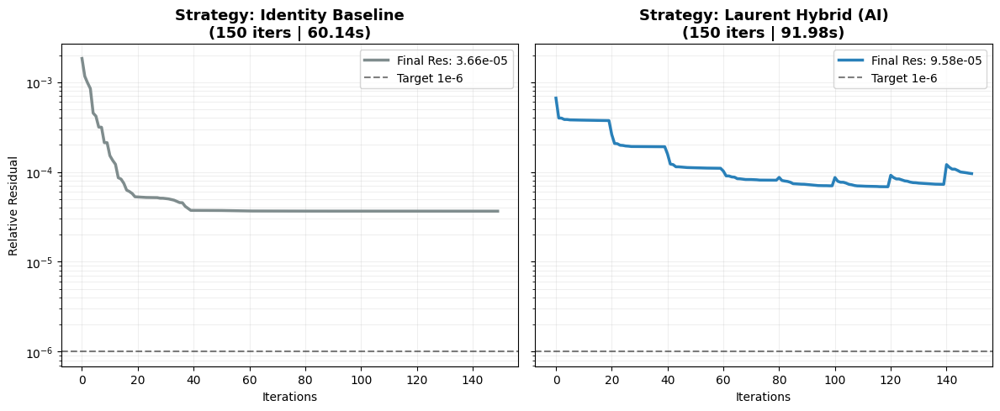

In [70]:
def plot_individual_evaluations(bench_results, target_tol=1e-6):
    """
    Generates separate plots for each model to analyze convergence behavior
    in isolation, as required for a high-level technical report.
    """
    num_models = len(bench_results)
    fig, axes = plt.subplots(1, num_models, figsize=(6 * num_models, 5), sharey=True)
    
    # Ensure axes is iterable even if there's only one model
    if num_models == 1: axes = [axes]
    
    # Define colors for branding/clarity
    colors = {"Identity Baseline": "#7f8c8d", "Laurent Hybrid (AI)": "#2980b9"}

    for ax, (name, data) in zip(axes, bench_results.items()):
        hist = data['history']
        iters = len(hist)
        time_val = data['time']
        
        # Main convergence line
        ax.semilogy(hist, color=colors.get(name, "#e67e22"), linewidth=2.5, label=f"Final Res: {hist[-1]:.2e}")
        
        # Reference Tolerance line
        ax.axhline(target_tol, color='black', linestyle='--', alpha=0.5, label='Target 1e-6')
        
        # Formatting for "Excellent" presentation
        ax.set_title(f"Strategy: {name}\n({iters} iters | {time_val:.2f}s)", fontsize=13, fontweight='bold')
        ax.set_xlabel("Iterations")
        if ax == axes[0]: ax.set_ylabel("Relative Residual")
        ax.grid(True, which='both', ls='-', alpha=0.2)
        ax.legend(loc='upper right')

    plt.tight_layout()
    plt.show()

# Run the benchmark (using the fixed apply_laurent_m_inv from the previous step)
# This assumes you have 'robust_unet_128' and 'solve_64' defined
results_final = run_multifreq_benchmark(128, 64, robust_unet_128)

# Generate the separate plots
plot_individual_evaluations(results_final)

## GMRES benchmark

In [1]:
import torch
import numpy as np
import time
from scipy.sparse.linalg import gmres

def benchmark_standard_gmres(target_om, u_true, f_vec, L_high):
    """
    Computes the iteration count for a standard, non-preconditioned GMRES
    to reach the desired tolerance at the target frequency.
    """
    print(f"\n--- Running Standard GMRES Baseline (Target: {target_om}Hz) ---")
    
    # 1. Define Callback to track convergence
    residuals = []
    def callback(rel_res):
        residuals.append(rel_res)
        if len(residuals) % 10 == 0:
            print(f"Iteration {len(residuals)}: Relative Residual = {rel_res:.2e}")

    # 2. Run GMRES
    # restart=100 or 200 is standard for Helmholtz to prevent memory explosion
    start_time = time.time()
    u_gmres, exit_code = gmres(
        L_high, 
        f_vec, 
        tol=1e-5, 
        maxiter=500, 
        restart=100, 
        callback=callback
    )
    end_time = time.time()

    # 3. Report Results
    if exit_code == 0:
        print(f"SUCCESS: Converged in {len(residuals)} iterations.")
    else:
        print(f"WARNING: GMRES did not converge within 500 iterations (Exit code: {exit_code})")
        
    print(f"Time taken: {end_time - start_time:.2f} seconds")
    
    return len(residuals), residuals

# --- EXECUTION ---
# Assuming you have your high-frequency operator L_128 and source f_128
# Replace 'robust_unet_128' logic with a call to this for the baseline
iter_count, res_history = benchmark_standard_gmres(128, None, f_128, L_128)

NameError: name 'f_128' is not defined

In [2]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_training_pair(coarse_sol, fine_sol, idx=0):
    """
    Visualizes the Real and Imaginary components of a training pair.
    Using raw strings (r"") to prevent LaTeX syntax warnings.
    """
    # Convert to numpy for plotting if they are tensors
    # Assuming shape [B, C, H, W] where C0=Real, C1=Imag
    c_img = coarse_sol[idx].detach().cpu().numpy()
    f_img = fine_sol[idx].detach().cpu().numpy()
    
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    cmap = 'RdBu_r' # Red-Blue is standard for wave oscillations
    
    # Input: Coarse Real/Imag
    im1 = axes[0, 0].imshow(c_img[0], cmap=cmap)
    axes[0, 0].set_title(r"Input: Real Part ($\omega_{low}$)")
    
    im2 = axes[0, 1].imshow(c_img[1], cmap=cmap)
    axes[0, 1].set_title(r"Input: Imaginary Part ($\omega_{low}$)")
    
    # Target: Fine Real/Imag
    im3 = axes[1, 0].imshow(f_img[0], cmap=cmap)
    axes[1, 0].set_title(r"Target: Real Part ($\omega_{high}$)")
    
    im4 = axes[1, 1].imshow(f_img[1], cmap=cmap)
    axes[1, 1].set_title(r"Target: Imaginary Part ($\omega_{high}$)")
    
    # Add colorbars to show amplitude scale
    fig.colorbar(im1, ax=axes[0, 0])
    fig.colorbar(im3, ax=axes[1, 0])

    for ax in axes.flat:
        ax.set_xticks([]); ax.set_yticks([])
        
    plt.tight_layout()
    plt.show()

In [3]:
# 1. Get one batch of data
data_iter = iter(train_loader)
inputs, targets = next(data_iter) 

# inputs: [Batch, 2, 608, 608] -> Coarse Real/Imag
# targets: [Batch, 2, 608, 608] -> Fine Real/Imag

# 2. Call the function for the first image in the batch (index 0)
visualize_training_pair(inputs, targets, idx=0)

NameError: name 'train_loader' is not defined

In [4]:
from torch.utils.data import DataLoader

# Check if train_dataset exists; if not, you must run your dataset creation cell first
try:
    train_loader = DataLoader(
        train_dataset, 
        batch_size=8,   # Adjust based on your GPU/Server memory
        shuffle=True
    )
    print("Success: train_loader is now defined.")
except NameError:
    print("Error: 'train_dataset' is not defined. Run the dataset generation cell first.")

Error: 'train_dataset' is not defined. Run the dataset generation cell first.


In [5]:
import torch
from torch.utils.data import TensorDataset

# Load the tensors you generated yesterday
# Replace 'path_to_data' with your actual folder on wave6
data_path = "data/helmholtz_train_608.pt" 

try:
    loaded_data = torch.load(data_path)
    # Usually, your saved data is a dictionary or a tuple of (inputs, targets)
    train_dataset = TensorDataset(loaded_data['inputs'], loaded_data['targets'])
    print("Success: train_dataset loaded from disk.")
except FileNotFoundError:
    print("Error: Could not find the file. Check your path!")

Error: Could not find the file. Check your path!


## data visualisation

In [21]:
# direct pair example: 64 -> 128
k = 0
src = prepare_torch_data(ds[64])[k]      # shape (2, H, W): [real, imag]
tgt = prepare_torch_data(ds[128])[k]     # shape (2, H, W)

# residual pair example: input + delta target
res_in, res_tgt = generate_residual_training_pairs(64, 128)
rin = res_in[k]                          # coarse field
rdelta = res_tgt[k]                      # fine - coarse


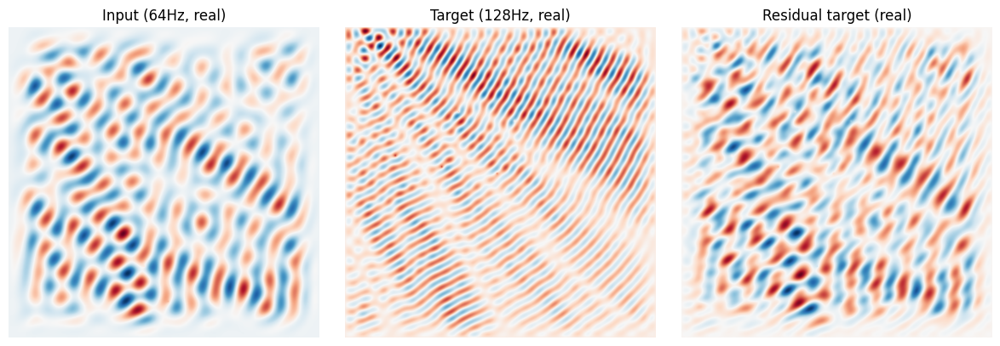

In [ ]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1, 3, figsize=(12,4))
ax[0].imshow(src[0], cmap="RdBu");   ax[0].set_title("Input (64, real)")
ax[1].imshow(tgt[0], cmap="RdBu");   ax[1].set_title("Target (128, real)")
ax[2].imshow(rdelta[0], cmap="RdBu");ax[2].set_title("Residual target (real)")
for a in ax: a.axis("off")
plt.tight_layout()


Chosen sample index: 0 score: 1.223878501207923


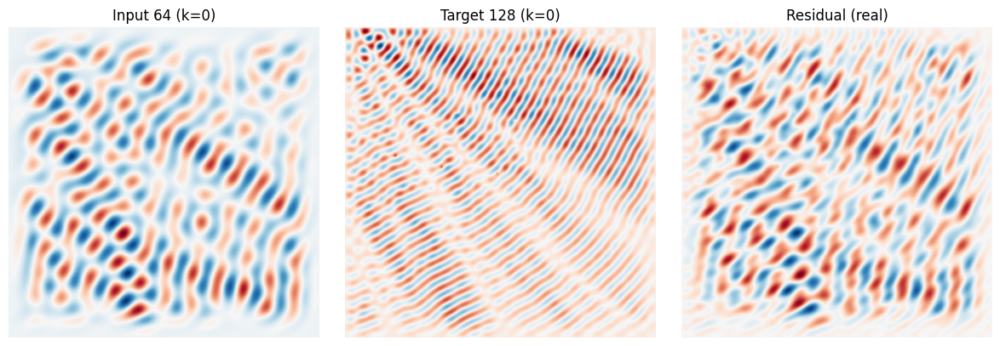

In [24]:
import numpy as np
import matplotlib.pyplot as plt

def pick_sample_away_from_pml(ds, src_om=64, tgt_om=128, n_pml=50, edge_band=60):
    # same sample index across frequencies
    U_src = ds[src_om]   # (N,H,W) complex
    U_tgt = ds[tgt_om]   # (N,H,W) complex
    N, H, W = U_tgt.shape

    # boundary mask (PML-near region)
    b = edge_band
    M = np.zeros((H, W), dtype=bool)
    M[:b, :] = True; M[-b:, :] = True; M[:, :b] = True; M[:, -b:] = True

    scores = []
    for k in range(N):
        mag = np.abs(U_tgt[k])
        boundary_energy = mag[M].mean()
        interior_energy = mag[~M].mean()
        score = interior_energy / (boundary_energy + 1e-12)  # higher is better
        scores.append(score)

    k_best = int(np.argmax(scores))
    return k_best, scores

k, scores = pick_sample_away_from_pml(ds, src_om=64, tgt_om=128, n_pml=N_PML, edge_band=70)
print("Chosen sample index:", k, "score:", scores[k])

# build pair for that k
src = prepare_torch_data(ds[64])[k]                 # (2,H,W)
tgt = prepare_torch_data(ds[128])[k]                # (2,H,W)
res = prepare_torch_data(ds[128] - ds[64])[k]       # residual target

fig, ax = plt.subplots(1,3, figsize=(12,4))
ax[0].imshow(src[0], cmap='RdBu'); ax[0].set_title(f"Input 64 (k={k})")
ax[1].imshow(tgt[0], cmap='RdBu'); ax[1].set_title(f"Target 128 (k={k})")
ax[2].imshow(res[0], cmap='RdBu'); ax[2].set_title("Residual (real)")
for a in ax: a.axis("off")
plt.tight_layout()


Source points (y, x, amp, phase):
(183, 182, 1.499, 3.779)
(373, 149, 1.148, 5.832)
(319, 163, 1.13, 5.959)
(461, 343, 1.369, 3.213)
(285, 357, 1.275, 0.867)


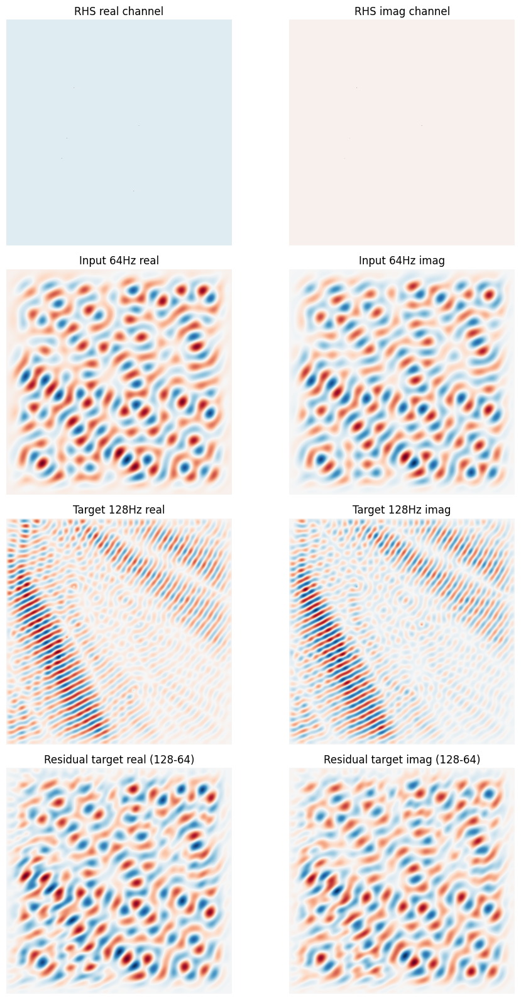

In [25]:
# --- 1) RHS with sources far from boundaries (and away from PML) ---
import numpy as np
import matplotlib.pyplot as plt
import scipy.sparse.linalg as spla

def make_centered_rhs(n_tot, n_pml, h, n_sources=4, extra_margin=90, seed=7):
    """
    extra_margin: additional pixels inside physical domain beyond PML.
    """
    rng = np.random.default_rng(seed)
    f = np.zeros((n_tot, n_tot), dtype=np.complex128)
    pts = []

    lo = n_pml + extra_margin
    hi = n_tot - n_pml - extra_margin
    assert hi > lo, "Reduce extra_margin; domain too small."

    for _ in range(n_sources):
        y = int(rng.integers(lo, hi))
        x = int(rng.integers(lo, hi))
        amp = rng.uniform(1.0, 2.0)
        phase = rng.uniform(0, 2*np.pi)
        f[y, x] += (amp * np.exp(1j * phase)) / (h**2)
        pts.append((y, x, amp, phase))

    return f, pts

f_rhs, pts = make_centered_rhs(N_TOT, N_PML, H, n_sources=5, extra_margin=90, seed=11)
b = f_rhs.reshape(-1)

print("Source points (y, x, amp, phase):")
for p in pts:
    print(tuple(round(v, 3) if isinstance(v, float) else v for v in p))

# --- 2) Solve at 64 and 128 to build channel inputs/targets ---
A64  = get_helmholtz_matrix(64,  N_TOT, H, N_PML, eta=4.0)
A128 = get_helmholtz_matrix(128, N_TOT, H, N_PML, eta=4.0)

u64  = spla.factorized(A64.tocsc())(b).reshape(N_TOT, N_TOT)
u128 = spla.factorized(A128.tocsc())(b).reshape(N_TOT, N_TOT)
delta = u128 - u64

# Channel format used by your training code: (2, H, W) = [real, imag]
input_64_ch   = np.stack([u64.real,   u64.imag],   axis=0)
target_128_ch = np.stack([u128.real,  u128.imag],  axis=0)
delta_ch      = np.stack([delta.real, delta.imag], axis=0)

# --- 3) Visualize how this enters channels ---
fig, ax = plt.subplots(4, 2, figsize=(10, 16))

ax[0,0].imshow(f_rhs.real, cmap="RdBu")
ax[0,0].set_title("RHS real channel")
ax[0,1].imshow(f_rhs.imag, cmap="RdBu")
ax[0,1].set_title("RHS imag channel")

ax[1,0].imshow(input_64_ch[0], cmap="RdBu")
ax[1,0].set_title("Input 64Hz real")
ax[1,1].imshow(input_64_ch[1], cmap="RdBu")
ax[1,1].set_title("Input 64Hz imag")

ax[2,0].imshow(target_128_ch[0], cmap="RdBu")
ax[2,0].set_title("Target 128Hz real")
ax[2,1].imshow(target_128_ch[1], cmap="RdBu")
ax[2,1].set_title("Target 128Hz imag")

ax[3,0].imshow(delta_ch[0], cmap="RdBu")
ax[3,0].set_title("Residual target real (128-64)")
ax[3,1].imshow(delta_ch[1], cmap="RdBu")
ax[3,1].set_title("Residual target imag (128-64)")

for a in ax.ravel():
    a.axis("off")
plt.tight_layout()
plt.show()


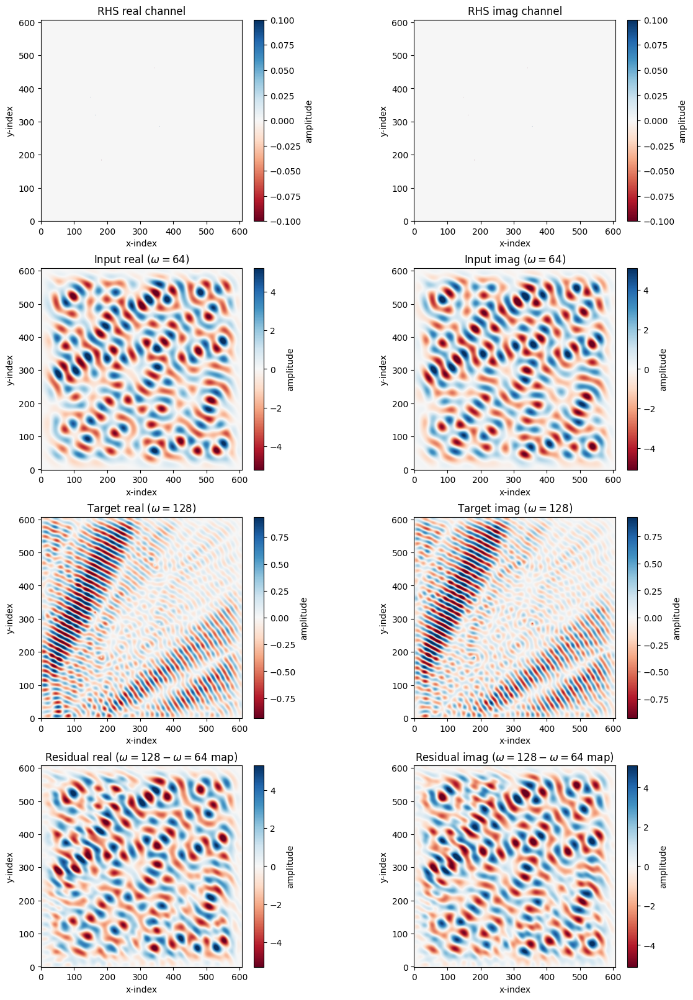

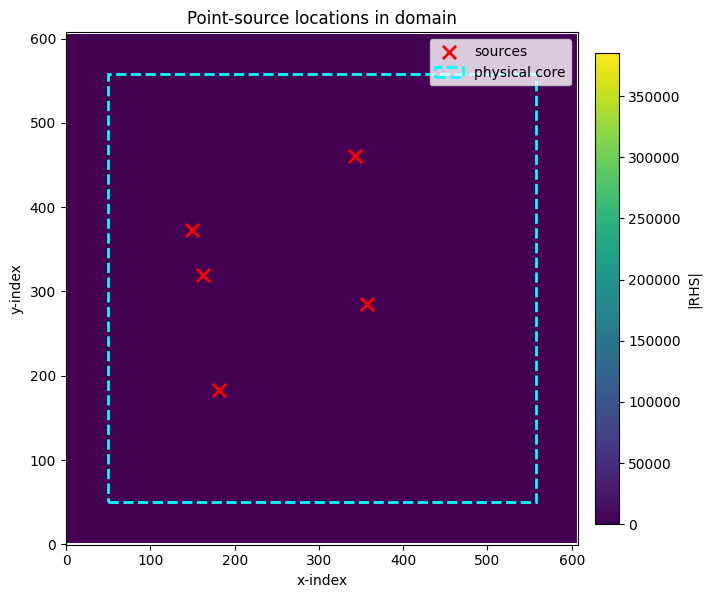

Sources (y, x, amplitude, phase):
(183, 182, 1.499, 3.779)
(373, 149, 1.148, 5.832)
(319, 163, 1.130, 5.959)
(461, 343, 1.369, 3.213)
(285, 357, 1.275, 0.867)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import scipy.sparse.linalg as spla

# -----------------------------
# 1) Build centered RHS sources
# -----------------------------
def make_centered_rhs(n_tot, n_pml, h, n_sources=5, extra_margin=90, seed=11):
    rng = np.random.default_rng(seed)
    f = np.zeros((n_tot, n_tot), dtype=np.complex128)
    pts = []

    lo = n_pml + extra_margin
    hi = n_tot - n_pml - extra_margin
    assert hi > lo, "extra_margin too large for this grid."

    for _ in range(n_sources):
        y = int(rng.integers(lo, hi))
        x = int(rng.integers(lo, hi))
        amp = rng.uniform(1.0, 2.0)
        phase = rng.uniform(0, 2*np.pi)
        f[y, x] += (amp * np.exp(1j * phase)) / (h**2)
        pts.append((y, x, amp, phase))
    return f, pts

f_rhs, pts = make_centered_rhs(N_TOT, N_PML, H, n_sources=5, extra_margin=90, seed=11)
b = f_rhs.reshape(-1)

# -----------------------------
# 2) Solve for two omegas
# -----------------------------
omega_src = 64
omega_tgt = 128

A_src = get_helmholtz_matrix(omega_src, N_TOT, H, N_PML, eta=4.0)
A_tgt = get_helmholtz_matrix(omega_tgt, N_TOT, H, N_PML, eta=4.0)

u_src = spla.factorized(A_src.tocsc())(b).reshape(N_TOT, N_TOT)
u_tgt = spla.factorized(A_tgt.tocsc())(b).reshape(N_TOT, N_TOT)
delta = u_tgt - u_src

# channel view: [real, imag]
inp = np.stack([u_src.real, u_src.imag], axis=0)
tgt = np.stack([u_tgt.real, u_tgt.imag], axis=0)
res = np.stack([delta.real, delta.imag], axis=0)

# -----------------------------
# 3) Plot with labels + colorbars
# -----------------------------
fig, ax = plt.subplots(4, 2, figsize=(12, 16), constrained_layout=True)

def show_panel(a, Z, title, cmap="RdBu"):
    vmax = np.percentile(np.abs(Z), 99)
    im = a.imshow(Z, cmap=cmap, origin="lower", vmin=-vmax, vmax=vmax)
    a.set_title(title)
    a.set_xlabel("x-index")
    a.set_ylabel("y-index")
    cb = fig.colorbar(im, ax=a, fraction=0.046, pad=0.02)
    cb.set_label("amplitude")
    return im

#show_panel(ax[0,0], f_rhs.real, "RHS real channel")
#show_panel(ax[0,1], f_rhs.imag, "RHS imag channel")
show_panel(ax[1,0], inp[0],  rf"Input real ($\omega={omega_src}$)")
show_panel(ax[1,1], inp[1],  rf"Input imag ($\omega={omega_src}$)")
show_panel(ax[2,0], tgt[0],  rf"Target real ($\omega={omega_tgt}$)")
show_panel(ax[2,1], tgt[1],  rf"Target imag ($\omega={omega_tgt}$)")
show_panel(ax[3,0], res[0],  rf"Residual real ($\omega={omega_tgt}-\omega={omega_src}$ map)")
show_panel(ax[3,1], res[1],  rf"Residual imag ($\omega={omega_tgt}-\omega={omega_src}$ map)")

plt.show()

# -----------------------------
# 4) Clear source-location plot
# -----------------------------
fig2, a2 = plt.subplots(1, 1, figsize=(7, 7), constrained_layout=True)

bg = np.abs(f_rhs)
im2 = a2.imshow(bg, origin="lower", cmap="viridis")
a2.set_title("Point-source locations in domain")
a2.set_xlabel("x-index")
a2.set_ylabel("y-index")
cb2 = fig2.colorbar(im2, ax=a2, fraction=0.046, pad=0.02)
cb2.set_label("|RHS|")

# Plot source markers
xs = [p[1] for p in pts]
ys = [p[0] for p in pts]
a2.scatter(xs, ys, s=90, c="red", marker="x", linewidths=2, label="sources")

# PML and physical-core outlines
outer = patches.Rectangle((0, 0), N_TOT-1, N_TOT-1, fill=False, edgecolor="white", linewidth=1.5)
core = patches.Rectangle((N_PML, N_PML), N_TOT-2*N_PML, N_TOT-2*N_PML,
                         fill=False, edgecolor="cyan", linestyle="--", linewidth=2, label="physical core")
a2.add_patch(outer)
a2.add_patch(core)
a2.legend(loc="upper right")
plt.show()

print("Sources (y, x, amplitude, phase):")
for p in pts:
    print(f"({p[0]}, {p[1]}, {p[2]:.3f}, {p[3]:.3f})")


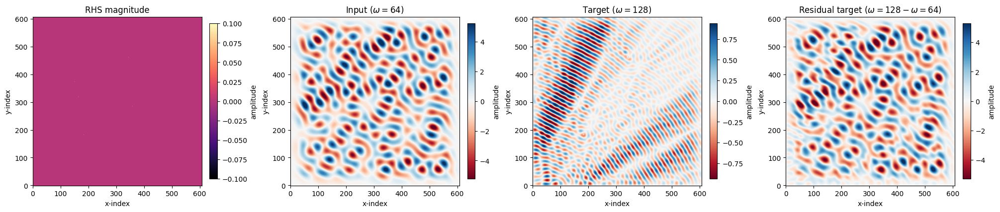

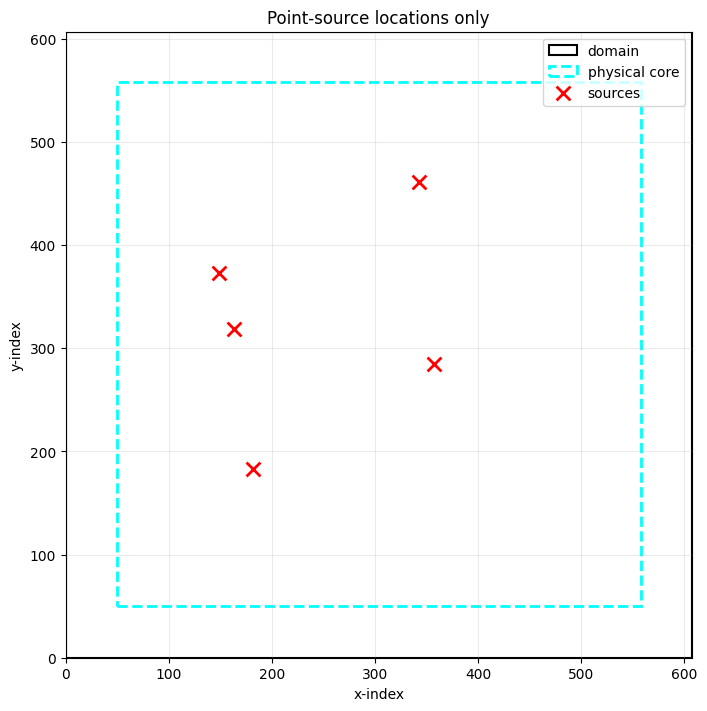

Sources (y, x, amplitude, phase):
(183, 182, 1.499, 3.779)
(373, 149, 1.148, 5.832)
(319, 163, 1.130, 5.959)
(461, 343, 1.369, 3.213)
(285, 357, 1.275, 0.867)


In [27]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import scipy.sparse.linalg as spla

# -----------------------------
# 1) Build centered RHS sources
# -----------------------------
def make_centered_rhs(n_tot, n_pml, h, n_sources=5, extra_margin=90, seed=11):
    rng = np.random.default_rng(seed)
    f = np.zeros((n_tot, n_tot), dtype=np.complex128)
    pts = []

    lo = n_pml + extra_margin
    hi = n_tot - n_pml - extra_margin
    assert hi > lo, "extra_margin too large for this grid."

    for _ in range(n_sources):
        y = int(rng.integers(lo, hi))
        x = int(rng.integers(lo, hi))
        amp = rng.uniform(1.0, 2.0)
        phase = rng.uniform(0, 2*np.pi)
        f[y, x] += (amp * np.exp(1j * phase)) / (h**2)
        pts.append((y, x, amp, phase))
    return f, pts

f_rhs, pts = make_centered_rhs(N_TOT, N_PML, H, n_sources=5, extra_margin=90, seed=11)
b = f_rhs.reshape(-1)

# -----------------------------
# 2) Solve for two omegas
# -----------------------------
omega_src = 64
omega_tgt = 128

A_src = get_helmholtz_matrix(omega_src, N_TOT, H, N_PML, eta=4.0)
A_tgt = get_helmholtz_matrix(omega_tgt, N_TOT, H, N_PML, eta=4.0)

u_src = spla.factorized(A_src.tocsc())(b).reshape(N_TOT, N_TOT)
u_tgt = spla.factorized(A_tgt.tocsc())(b).reshape(N_TOT, N_TOT)
delta = u_tgt - u_src

# -----------------------------
# 3) Plot only main maps (no separate real/imag channels)
# -----------------------------
fig, ax = plt.subplots(1, 4, figsize=(20, 5), constrained_layout=True)

def show_map(a, Z, title, cmap="RdBu"):
    vmax = np.percentile(np.abs(Z), 99)
    im = a.imshow(Z, origin="lower", cmap=cmap, vmin=-vmax, vmax=vmax)
    a.set_title(title)
    a.set_xlabel("x-index")
    a.set_ylabel("y-index")
    cb = fig.colorbar(im, ax=a, fraction=0.046, pad=0.02)
    cb.set_label("amplitude")

show_map(ax[0], np.abs(f_rhs), "RHS magnitude", cmap="magma")
show_map(ax[1], u_src.real,  rf"Input ($\omega={omega_src}$)")
show_map(ax[2], u_tgt.real,  rf"Target ($\omega={omega_tgt}$)")
show_map(ax[3], delta.real,  rf"Residual target ($\omega={omega_tgt}-\omega={omega_src}$)")

plt.show()

# -----------------------------
# 4) Source-location-only chart (no color map)
# -----------------------------
fig2, a2 = plt.subplots(1, 1, figsize=(7, 7), constrained_layout=True)
a2.set_title("Point-source locations only")
a2.set_xlabel("x-index")
a2.set_ylabel("y-index")
a2.set_xlim(0, N_TOT - 1)
a2.set_ylim(0, N_TOT - 1)
a2.set_aspect("equal")

# PML / physical core outlines
outer = patches.Rectangle((0, 0), N_TOT-1, N_TOT-1, fill=False, edgecolor="black", linewidth=1.5, label="domain")
core = patches.Rectangle((N_PML, N_PML), N_TOT-2*N_PML, N_TOT-2*N_PML,
                         fill=False, edgecolor="cyan", linestyle="--", linewidth=2, label="physical core")
a2.add_patch(outer)
a2.add_patch(core)

# Source markers only
xs = [p[1] for p in pts]
ys = [p[0] for p in pts]
a2.scatter(xs, ys, s=100, c="red", marker="x", linewidths=2, label="sources")
a2.legend(loc="upper right")
a2.grid(alpha=0.25)
plt.show()

print("Sources (y, x, amplitude, phase):")
for p in pts:
    print(f"({p[0]}, {p[1]}, {p[2]:.3f}, {p[3]:.3f})")


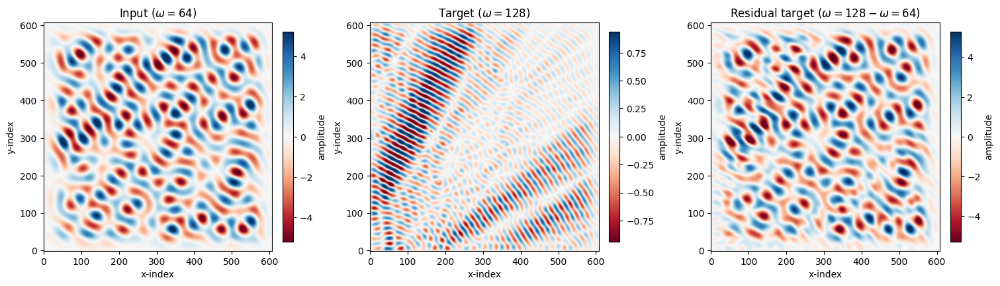

In [28]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)

show_map(ax[0], u_src.real,  rf"Input ($\omega={omega_src}$)")
show_map(ax[1], u_tgt.real,  rf"Target ($\omega={omega_tgt}$)")
show_map(ax[2], delta.real,  rf"Residual target ($\omega={omega_tgt}-\omega={omega_src}$)")

plt.show()


X_u_only: (20, 2, 608, 608)   X_with_rhs: (20, 4, 608, 608)   Y_direct: (20, 2, 608, 608)   Y_resid: (20, 2, 608, 608)


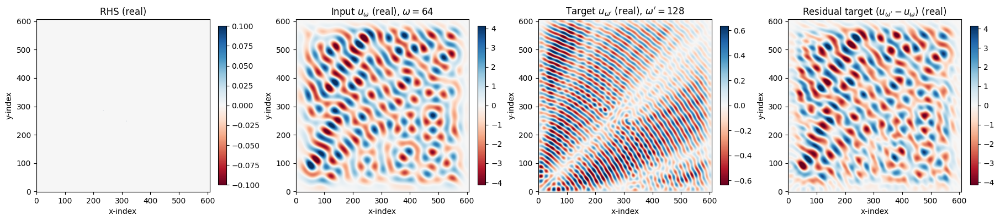

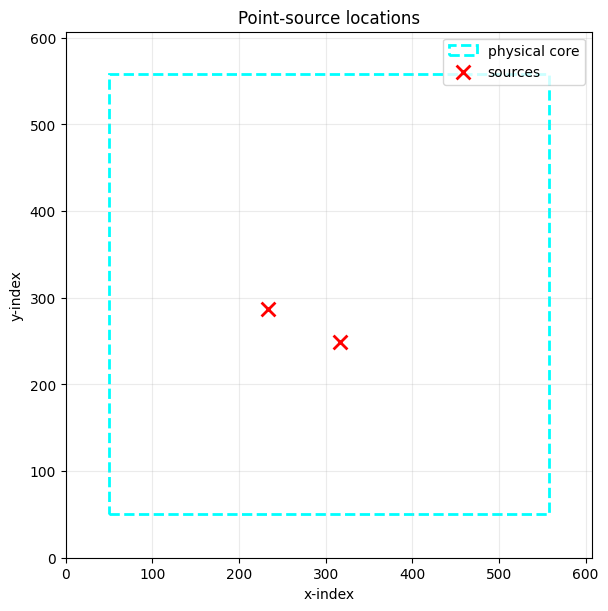

In [29]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.sparse.linalg as spla
import matplotlib.patches as patches

def make_rhs_far_from_boundary(n_tot, n_pml, h, n_sources=4, extra_margin=90, seed=None):
    rng = np.random.default_rng(seed)
    f = np.zeros((n_tot, n_tot), dtype=np.complex128)
    pts = []
    lo = n_pml + extra_margin
    hi = n_tot - n_pml - extra_margin
    assert hi > lo, "extra_margin too large"
    for _ in range(n_sources):
        y = int(rng.integers(lo, hi))
        x = int(rng.integers(lo, hi))
        amp = rng.uniform(1.0, 2.0)
        phase = rng.uniform(0, 2*np.pi)
        f[y, x] += (amp * np.exp(1j * phase)) / (h**2)
        pts.append((y, x, amp, phase))
    return f, pts

def build_transfer_dataset(omega_src, omega_tgt, n_samples=32, seed=0):
    rng = np.random.default_rng(seed)
    A_src = get_helmholtz_matrix(omega_src, N_TOT, H, N_PML, eta=4.0)
    A_tgt = get_helmholtz_matrix(omega_tgt, N_TOT, H, N_PML, eta=4.0)
    solve_src = spla.factorized(A_src.tocsc())
    solve_tgt = spla.factorized(A_tgt.tocsc())

    rhs_list, u_src_list, u_tgt_list, pts_list = [], [], [], []
    for _ in range(n_samples):
        f, pts = make_rhs_far_from_boundary(
            N_TOT, N_PML, H, n_sources=int(rng.integers(2, 7)),
            extra_margin=90, seed=int(rng.integers(1_000_000))
        )
        b = f.reshape(-1)
        u_src = solve_src(b).reshape(N_TOT, N_TOT)
        u_tgt = solve_tgt(b).reshape(N_TOT, N_TOT)

        rhs_list.append(f)
        u_src_list.append(u_src)
        u_tgt_list.append(u_tgt)
        pts_list.append(pts)

    rhs = np.array(rhs_list)      # (N,H,W) complex
    us  = np.array(u_src_list)    # (N,H,W) complex
    ut  = np.array(u_tgt_list)    # (N,H,W) complex
    delta = ut - us

    # model tensors
    X_u_only = np.stack([us.real, us.imag], axis=1)                       # (N,2,H,W)
    X_with_rhs = np.stack([us.real, us.imag, rhs.real, rhs.imag], axis=1) # (N,4,H,W)
    Y_direct = np.stack([ut.real, ut.imag], axis=1)                       # (N,2,H,W)
    Y_resid  = np.stack([delta.real, delta.imag], axis=1)                 # (N,2,H,W)
    return rhs, us, ut, delta, pts_list, X_u_only, X_with_rhs, Y_direct, Y_resid

# Build pairs for T: omega_src -> omega_tgt
omega_src, omega_tgt = 64, 128
rhs, us, ut, delta, pts_list, X2, X4, Yd, Yr = build_transfer_dataset(omega_src, omega_tgt, n_samples=20, seed=42)

print("X_u_only:", X2.shape, "  X_with_rhs:", X4.shape, "  Y_direct:", Yd.shape, "  Y_resid:", Yr.shape)

# Visualize one training pair i
i = 0
fig, ax = plt.subplots(1, 4, figsize=(18, 4.5), constrained_layout=True)

def show(a, Z, title, cmap="RdBu"):
    vmax = np.percentile(np.abs(Z), 99)
    im = a.imshow(Z, origin="lower", cmap=cmap, vmin=-vmax, vmax=vmax)
    a.set_title(title)
    a.set_xlabel("x-index")
    a.set_ylabel("y-index")
    plt.colorbar(im, ax=a, fraction=0.046, pad=0.02)

show(ax[0], rhs[i].real,   "RHS (real)")
show(ax[1], us[i].real,    rf"Input $u_{{\omega}}$ (real), $\omega={omega_src}$")
show(ax[2], ut[i].real,    rf"Target $u_{{\omega'}}$ (real), $\omega'={omega_tgt}$")
show(ax[3], delta[i].real, rf"Residual target $(u_{{\omega'}}-u_{{\omega}})$ (real)")

plt.show()

# Source-location-only plot for same sample
fig2, a2 = plt.subplots(1, 1, figsize=(6, 6), constrained_layout=True)
a2.set_title("Point-source locations")
a2.set_xlabel("x-index")
a2.set_ylabel("y-index")
a2.set_xlim(0, N_TOT - 1)
a2.set_ylim(0, N_TOT - 1)
a2.set_aspect("equal")
a2.add_patch(patches.Rectangle((N_PML, N_PML), N_TOT-2*N_PML, N_TOT-2*N_PML,
                               fill=False, edgecolor="cyan", linestyle="--", linewidth=2, label="physical core"))
xs = [p[1] for p in pts_list[i]]
ys = [p[0] for p in pts_list[i]]
a2.scatter(xs, ys, c="red", marker="x", s=100, linewidths=2, label="sources")
a2.grid(alpha=0.25)
a2.legend(loc="upper right")
plt.show()


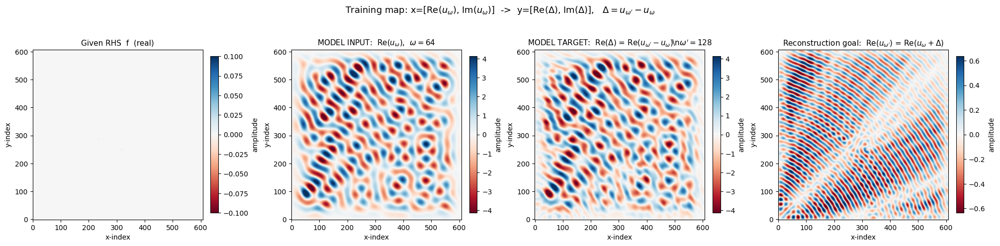

In [30]:
import numpy as np
import matplotlib.pyplot as plt

def plot_training_pair_clarity(rhs, u_src, u_tgt, omega_src, omega_tgt, sample_idx=0):
    """
    rhs, u_src, u_tgt: complex arrays with shape (N,H,W)
    """
    f = rhs[sample_idx]
    us = u_src[sample_idx]
    ut = u_tgt[sample_idx]
    d  = ut - us

    fig, ax = plt.subplots(1, 4, figsize=(20, 5), constrained_layout=True)

    def show(a, Z, title, cmap="RdBu"):
        vmax = np.percentile(np.abs(Z), 99)
        im = a.imshow(Z, origin="lower", cmap=cmap, vmin=-vmax, vmax=vmax)
        a.set_title(title, fontsize=11)
        a.set_xlabel("x-index")
        a.set_ylabel("y-index")
        cb = fig.colorbar(im, ax=a, fraction=0.046, pad=0.02)
        cb.set_label("amplitude")

    show(ax[0], f.real,  "Given RHS  f  (real)")
    show(ax[1], us.real, rf"MODEL INPUT:  Re($u_{{\omega}}$),  $\omega={omega_src}$")
    show(ax[2], d.real,  rf"MODEL TARGET:  Re($\Delta$) = Re($u_{{\omega'}}-u_{{\omega}}$)\n$\omega'={omega_tgt}$")
    show(ax[3], ut.real, rf"Reconstruction goal:  Re($u_{{\omega'}}$) = Re($u_{{\omega}}+\Delta$)")

    # arrows / formula text
    fig.suptitle(
        rf"Training map: x=[Re($u_{{\omega}}$), Im($u_{{\omega}}$)]  ->  y=[Re($\Delta$), Im($\Delta$)],   $\Delta=u_{{\omega'}}-u_{{\omega}}$",
        fontsize=13
    )
    plt.show()

# Example call:
plot_training_pair_clarity(rhs, us, ut, omega_src=64, omega_tgt=128, sample_idx=0)


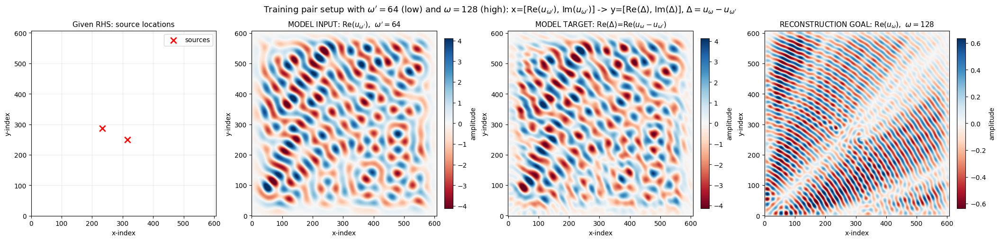

In [32]:
import numpy as np
import matplotlib.pyplot as plt

def plot_training_pair_clarity(rhs, u_src, u_tgt, omega_src, omega_tgt, sample_idx=0):
    """
    rhs, u_src, u_tgt: complex arrays with shape (N,H,W)
    Convention here:
      omega_src = low frequency = omega'
      omega_tgt = high frequency = omega
    """
    f = rhs[sample_idx]
    us = u_src[sample_idx]   # u_{omega'}
    ut = u_tgt[sample_idx]   # u_{omega}
    d  = ut - us             # Delta = u_omega - u_omega'

    fig, ax = plt.subplots(1, 4, figsize=(21, 5), constrained_layout=True)

    def show(a, Z, title, cmap="RdBu"):
        vmax = np.percentile(np.abs(Z), 99)
        im = a.imshow(Z, origin="lower", cmap=cmap, vmin=-vmax, vmax=vmax)
        a.set_title(title, fontsize=11)
        a.set_xlabel("x-index")
        a.set_ylabel("y-index")
        cb = fig.colorbar(im, ax=a, fraction=0.046, pad=0.02)
        cb.set_label("amplitude")

    # Panel 1: source locations only (no field colormap)
    a0 = ax[0]
    H, W = f.shape
    mag_f = np.abs(f)
    ys, xs = np.where(mag_f > 0)  # point-source indices
    a0.set_title("Given RHS: source locations", fontsize=11)
    a0.set_xlim(0, W - 1)
    a0.set_ylim(0, H - 1)
    a0.set_aspect("equal")
    a0.set_xlabel("x-index")
    a0.set_ylabel("y-index")
    a0.scatter(xs, ys, c="red", marker="x", s=80, linewidths=2, label="sources")
    a0.grid(alpha=0.25)
    a0.legend(loc="upper right")

    # Panel 2-4 with requested omega/omega' naming
    show(ax[1], us.real, rf"MODEL INPUT: Re($u_{{\omega'}}$),  $\omega'={omega_src}$")
    show(ax[2], d.real,  rf"MODEL TARGET: Re($\Delta$)=Re($u_{{\omega}}-u_{{\omega'}}$)")
    show(ax[3], ut.real, rf"RECONSTRUCTION GOAL: Re($u_{{\omega}}$),  $\omega={omega_tgt}$")

    fig.suptitle(
        rf"Training pair setup with $\omega'={omega_src}$ (low) and $\omega={omega_tgt}$ (high): "
        rf"x=[Re($u_{{\omega'}}$), Im($u_{{\omega'}}$)] -> y=[Re($\Delta$), Im($\Delta$)], "
        rf"$\Delta=u_{{\omega}}-u_{{\omega'}}$",
        fontsize=13
    )
    plt.show()

# Example call:
plot_training_pair_clarity(rhs, us, ut, omega_src=64, omega_tgt=128, sample_idx=0)